==============================================================================================
## Practicum 4: Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

In this laboratory we will treat the following main topics:

1) Template matching
    - Normalized Cross-correlation
    - Application to object (eye) detection 

2) Image Descriptors: "Sliding window" and HOG image descriptor
   - Application to object (car) detection

3) Image matching (recognition by correspondance) based on feature extraction (ORB)
    - Application to object (logo) detection
    
In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

All code should be commented in English. Answers of the questions and comments on the exercises should be given in English too.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 4.1 Template matching

4.1.1 Given the image 'einstein.png' and the template 'eye.png', detect the location of the template in the image comparing the use of:
- euclidean distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Hint: you can take as an example, the template matching on the [coin exercise](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_template.html#sphx-glr-auto-examples-features-detection-plot-template-py) in skimage.
Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

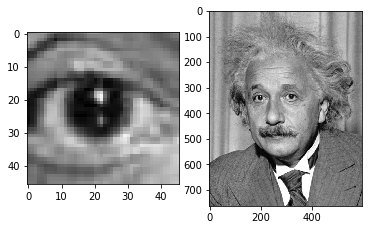

In [1]:
from skimage import io
from matplotlib import pyplot as plt
import numpy as np
from skimage import io, color, img_as_float, transform
from skimage.feature import match_template
%matplotlib inline

plt.subplot(1,2,1)
eye=io.imread('./images/eye.png')
plt.imshow(eye)

plt.subplot(1,2,2)
einstein=io.imread('./images/einstein.png')
plt.imshow(einstein)

plt.show()

In [2]:
# Visualization and template matching functions definition
from skimage import img_as_float

def euclidean(image, template, threshold = 8):
    
    image, template = img_as_float(image), img_as_float(template)

    matchx = image.shape[0] - template.shape[0]
    matchy = image.shape[1] - template.shape[1]
    
    match = np.zeros((matchx, matchy))
    
    for i in range(matchx):
        for j in range(matchy):
            match[i, j] = np.linalg.norm(image[i:i + template.shape[0], j: j+template.shape[1]] - template)
    
    representation, position = plt.subplots(ncols=4, nrows=1,figsize=(10,20))
    position[0].imshow(template, cmap='gray')
    position[0].set_title('Template')
    position[1].imshow(image, cmap='gray')
    position[1].set_title('Einstein')
    position[2].imshow(match, cmap='gray')
    position[2].set_title('Euclidean')
    position[3].imshow(match < threshold, cmap='gray')
    position[3].set_title('Threshold Euclidean')
    
    plt.show()

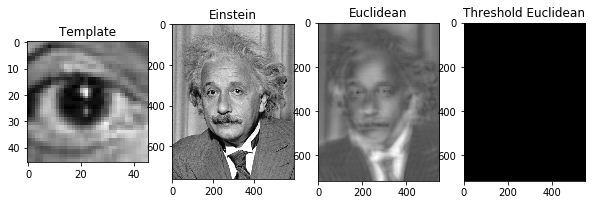

In [3]:
eye = io.imread('./images/eye.png')
einstein = io.imread('./images/einstein.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

euclidean(einstein, eye)

In [4]:
def cross_correlation(image, template, threshold = 0.7):
    
    image = img_as_float(image)
    template = img_as_float(template)
    
    match = match_template(image, template)
    
    region = np.unravel_index(np.argmax(match), match.shape)
    x, y = region[::-1]
    matchx, matchy = template.shape
    rect = plt.Rectangle((x, y), matchy, matchx, edgecolor='r', facecolor='none')

    representation, position = plt.subplots(ncols=4, nrows=1,figsize=(10,20))
    position[0].imshow(template, cmap='gray')
    position[0].set_title('Template')
    position[1].add_patch(rect)
    position[1].imshow(image, cmap='gray')
    position[1].set_title('Einstein')
    position[2].imshow(match, cmap='gray')
    position[2].set_title('Cross Correlation')
    position[2].autoscale(False)
    position[2].plot(x, y, 'o', markeredgecolor='r', markerfacecolor='none', markersize=10)
    position[3].imshow(match > threshold, cmap='gray')
    position[3].set_title('Threshold Correlation')

    plt.show()

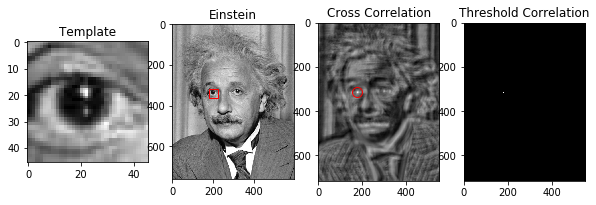

In [5]:
eye = io.imread('./images/eye.png')
einstein = io.imread('./images/einstein.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

cross_correlation(image_gray, template_gray)

4.1.2 How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? To this purpose, read the images "einstein_br.png" and "einstein_mask.png".

Visualize the normalized cross-correlation image between the template and the image as well as this very same image in a binarized form in order to show where is the minimal distance between the template and the image. 
* How does the minimum distance between the template and the image change? 
* What are the minimal distance pixels in the correlation images? 
* What are the distances between the template and the image around the eyes of the image? 

Use titles of the figures to explain what is displayed.


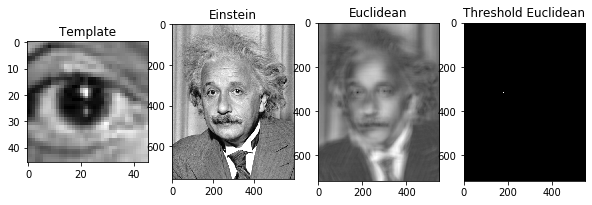

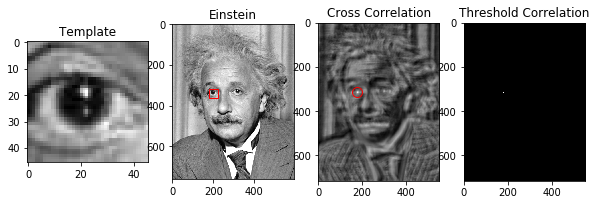

In [6]:
#Einstein_br image
einstein_br=io.imread('./images/einstein_br.png')
image_br_gray = color.rgb2gray(einstein_br)

euclidean(image_br_gray, template_gray)
cross_correlation(image_br_gray, template_gray)

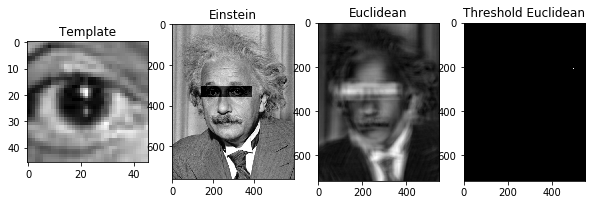

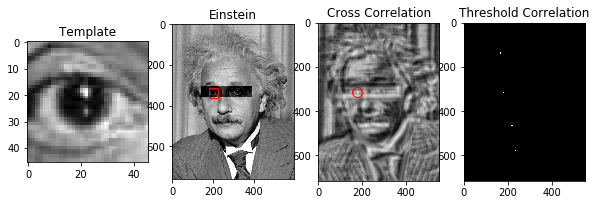

In [7]:
# Einstein_mask as gray
einstein_mask=io.imread('./images/einstein_mask.png')
image_mask_gray = color.rgb2gray(einstein_mask)

euclidean(image_mask_gray, template_gray, threshold = 8.5)
cross_correlation(image_mask_gray, template_gray, threshold=0.5)

## ANSWERS

1. The minimum distance between the template image and the image is between 0 and 1. Therefore, when the template image matches to the image, the distance is 0. Otherwise, the distance depends on the difference between them.

2. The minimal distance pixels in the correlation images are matched absolutely. With einstein_mask.png we have some false positives and we have to change thresold value.

3. The distances between the template and the image around the eyes are more or less '0.0' because our template has matched with image.

4.1.3 How does the result of the template matching changes if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the 'eye_br.png' template.

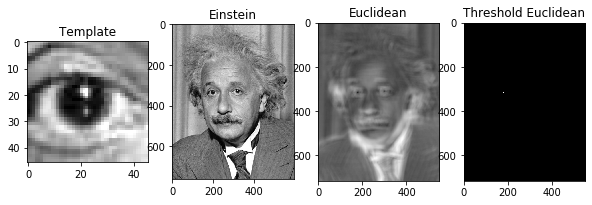

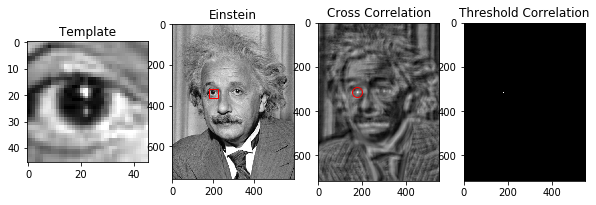

In [8]:
einstein = io.imread('./images/einstein.png')
image_gray = color.rgb2gray(einstein)
eye_br = io.imread('./images/eye_br.png')
template_br_gray = color.rgb2gray(eye_br)

euclidean(image_gray, template_br_gray, threshold = 9)
cross_correlation(image_gray, template_br_gray)

## ANSWER

When we put a template with contrast changes, for example, a brighter template. we notice that euclidean distance method doesn't return any detection. Instead, the normalized cross-correlation keeps returning the detection.

4.1.4 Check how the result changes if the template is rotated. Visualize the template and its rotation by 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.
Help: use the function rotate() in skimage.transform

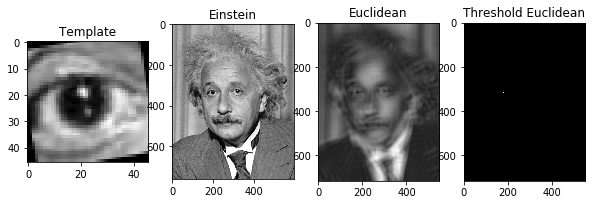

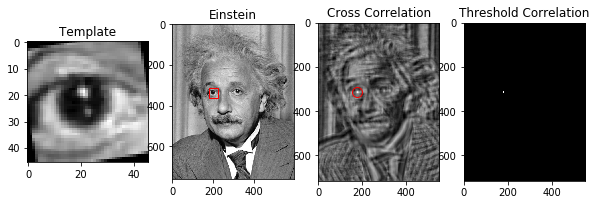

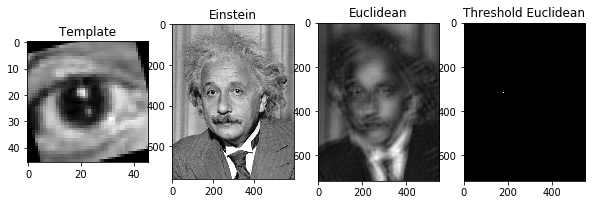

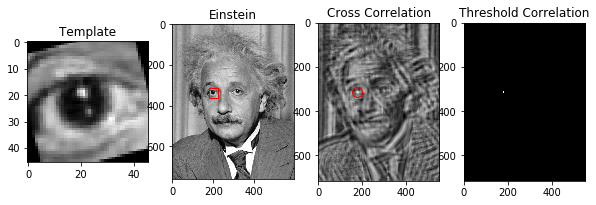

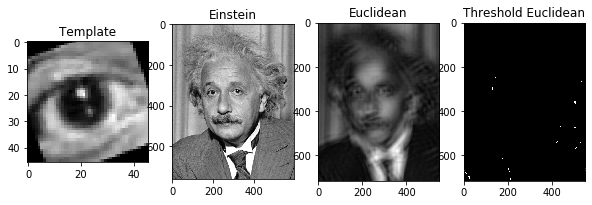

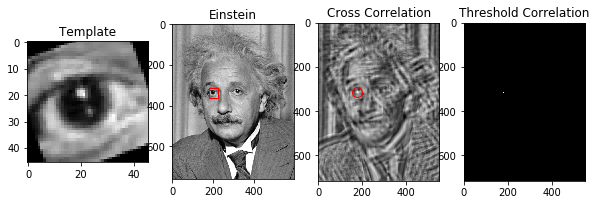

In [9]:
template_rotate10 = transform.rotate(template_gray,10)
template_rotate15 = transform.rotate(template_gray,15)
template_rotate20 = transform.rotate(template_gray,20)

euclidean(image_gray, template_rotate10, threshold=9)
cross_correlation(image_gray, template_rotate10, threshold=0.5)
euclidean(image_gray, template_rotate15, threshold=10.15)
cross_correlation(image_gray, template_rotate15, threshold=0.5)
euclidean(image_gray, template_rotate20, threshold=10.8)
cross_correlation(image_gray, template_rotate20, threshold=0.46)

Comment what is the template matching process, what advantages and disadvantages it has, how sensible is to image deformation in photometric and spatial dimensions, what parameters it has and which measure for image comparisons works better.

The template matching process consists in finding "template image" in original image. This process requieres finding the distance by slicing the size of template over original image.

Exist two methods to find it: euclidean distance and cross_correlation.

Advantages:
It is very useful to find a template in an image where the contrast and the ilumnation has changed (contrast & illumination invariant).
Disadvantages:
It is very sensible to the image changes in scale and rotation (scale & rotation variant).

This means that the perfect parameters for comparisons would be having the template in the same scale/rotation as original image. Otherwise, more false positives will appear. It is important to clarify that we have to adapt our threshold so that we can find our results in the best way.

# 4.2 Histogram of Oriented Gradients


The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image 'car_template.png' and the folder 'cars', apply the HOG descriptor in order to detect where there is a car in the images in the folder 'car'. To this purpose, apply the "sliding window" technique. The algorithm can be:

a) Read the car template ('car_template.png') and obtain its HOG descriptor. Visualize it. [Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py) 

b) Read images from the folder "car", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the car template. 

c) Visualize the location in the image that is the most similar to the car template. What distance will you use to compare both HOG descriptors of the car template and the image region? Compare if there is any difference in their results. 

d) Compute in how many images the cars were detected correctly and discuss the algorithm failures. What do you think can be the reasons for the failure?

Hint: the HOG detector function is in the skimage.feature library. 

If you want to accelerate algorithm execution, you can apply the sliding window with a step of X pixels (e.g. X=5).

Discuss what is the HOG descriptor, what are the parameters of the algorithm, which are the optimal values for the car detection testing several values of the parameters up to your criterion. Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

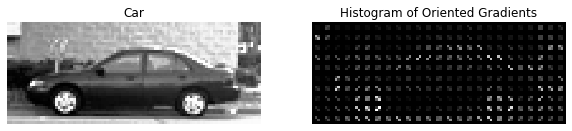

In [21]:
from skimage.feature import hog
from skimage import data, exposure

car = io.imread('./images/car_template.png')

car = color.rgb2gray(car)
carNorm = img_as_float(car)

fd, hogCar = hog(carNorm, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True)
hog_car_rescaled = exposure.rescale_intensity(hogCar, in_range=(0, 20))

representation, position = plt.subplots(ncols=2, nrows=1,figsize=(10,20))
position[0].imshow(car, cmap='gray')
position[0].set_title('Car')
position[0].set_axis_off()
position[1].imshow(hog_car_rescaled, cmap='gray')
position[1].set_axis_off()
position[1].set_title('Histogram of Oriented Gradients')

plt.show()

In [11]:
from queue import PriorityQueue
import matplotlib.patches as patches

def generate_hog(img):
    """
    Realitza el HOG de la imatge passada per paràmetre
    :param img: Imatge a realiztar el HOG
    :return hog_img: Retorna el HOG de la imatge
    """
    image = img.copy()
    image_gray = color.rgb2gray(image)
    image_gray_f = img_as_float(image_gray)
    hog_img = hog(image_gray_f, orientations=8, pixels_per_cell=(4,4), cells_per_block=(2,2))
    return hog_img


def compare_hogs(template, image):
    """
    Compara un template am una image mitjançant HOG
    :param template: Template que volem utilitzar
    :param image: Imatge a trobar el template amb HOG
    """
    
    hog_template = generate_hog(template)
    
    matchX = image.shape[0]-template.shape[0]
    matchY = image.shape[1]-template.shape[1]
    
    match = np.ones([image.shape[0],image.shape[1]])
    
    # We need a PriorityQueue to know which will be our minimum distance
    pq = PriorityQueue()
    
    # Slicing with x of 5
    for i in range(0,matchX,5):
        for j in range(0,matchY,5):
            
            # Center for the result HOG to display
            posx = template.shape[0]+i-(int(template.shape[0]/2))
            posy = template.shape[1]+j-(int(template.shape[1]/2))
            
            # Get the region of the image to generate the HOG
            region = image[i:i+template.shape[0],j:j+template.shape[1]]
            hog_region = generate_hog(region)
            hog_region_rescaled = exposure.rescale_intensity(hog_region, in_range=(0,20))
            
            # Do euclidean distance with HOG of our region and our template
            hog_distance = np.linalg.norm(hog_region_rescaled - hog_template)
            match[posx,posy] = hog_distance
            
            # Save the information into the PriorityQueue
            info = [i, j]
            pq.put((hog_distance, info))
            
    # Get this min of our PQ        
    inf = pq.get()[1]
    minX = inf[0]
    minY = inf[1]
    
    # Generate two rectangles for the HOG and the original image
    rect = patches.Rectangle((minY,minX), template.shape[1], template.shape[0], edgecolor='r', facecolor='none')
    rect1 = patches.Rectangle((minY,minX), template.shape[1], template.shape[0], edgecolor='r', facecolor='none')

    representation, position = plt.subplots(ncols=3, figsize=(15,20))
    position[0].imshow(template, cmap='gray')
    position[0].set_title("car template")
    position[1].imshow(image, cmap='gray')
    position[1].add_patch(rect)
    position[1].set_title("Match Region")
    position[2].imshow(match, cmap='gray')
    position[2].set_title("HOG distances")
    position[2].add_patch(rect1)
    plt.show()
    
    

Imatge numero:  0


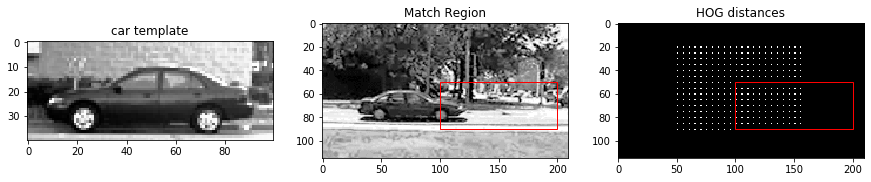

Imatge numero:  1


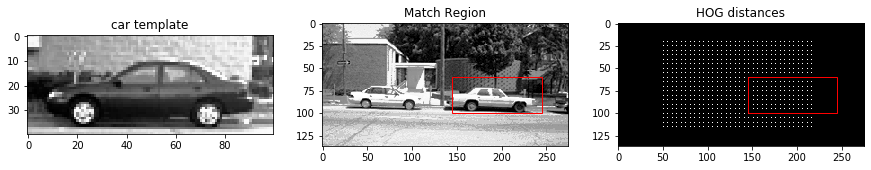

Imatge numero:  2


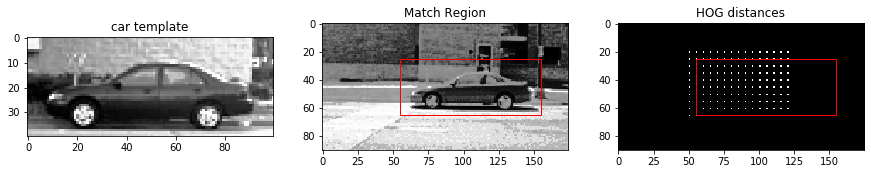

Imatge numero:  3


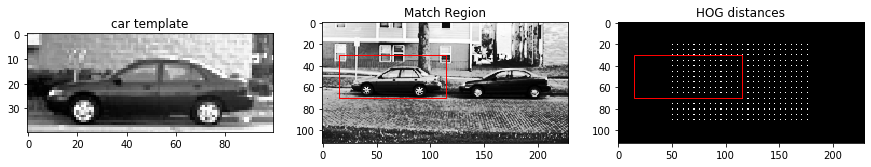

Imatge numero:  4


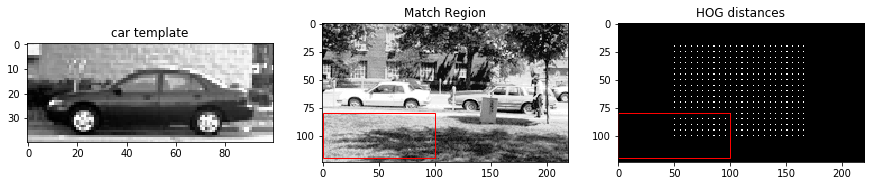

Imatge numero:  5


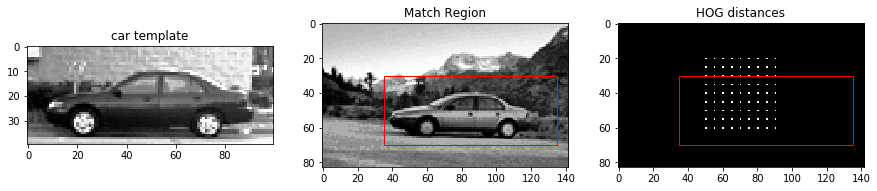

Imatge numero:  6


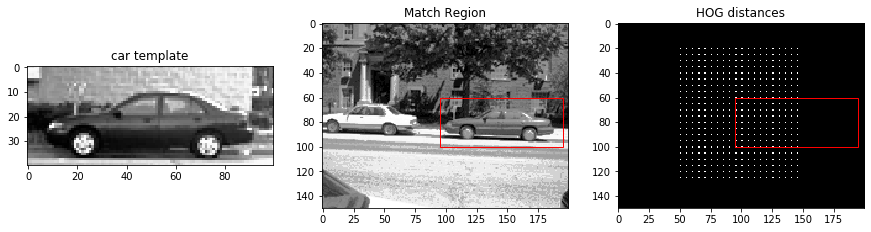

Imatge numero:  7


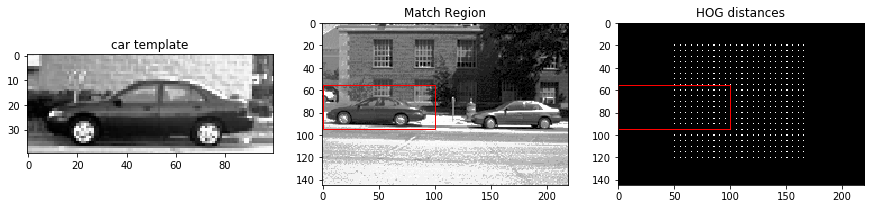

Imatge numero:  8


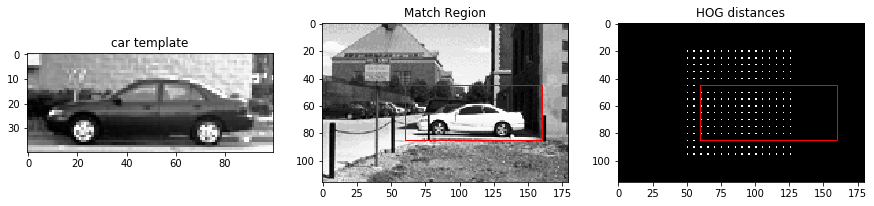

Imatge numero:  9


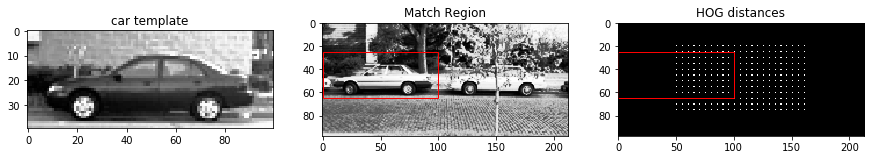

Imatge numero:  10


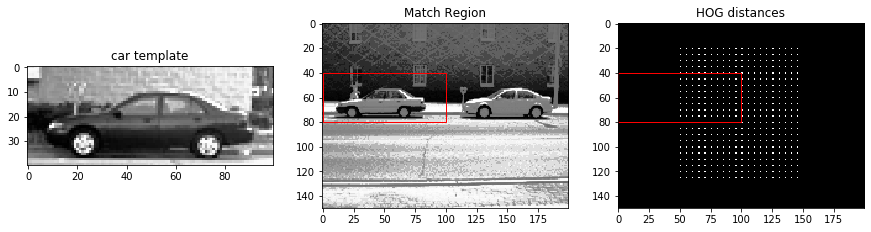

Imatge numero:  11


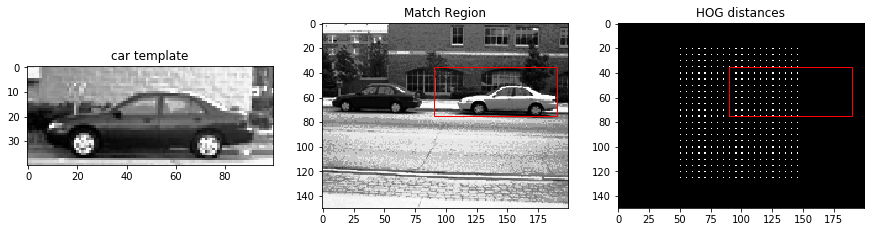

Imatge numero:  12


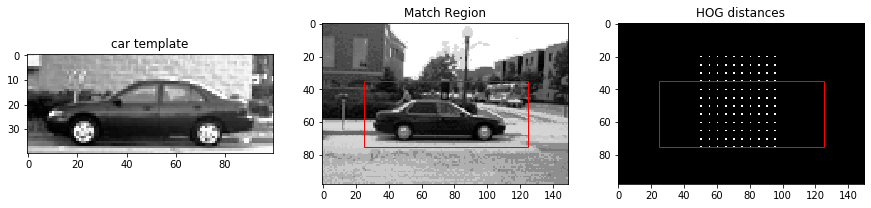

Imatge numero:  13


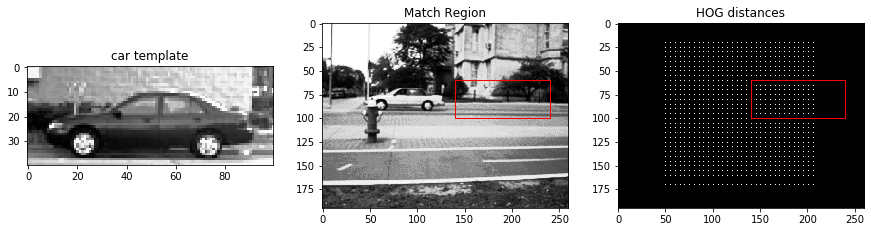

Imatge numero:  14


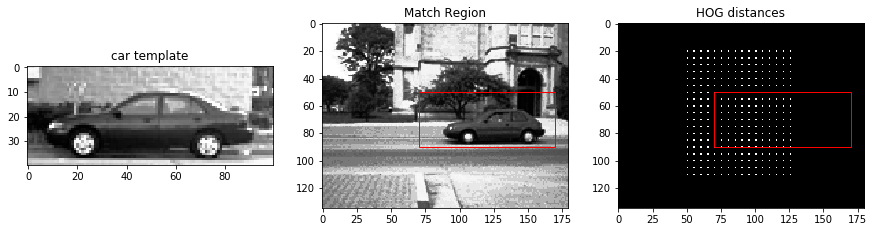

Imatge numero:  15


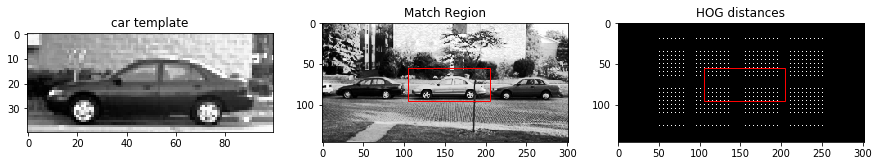

Imatge numero:  16


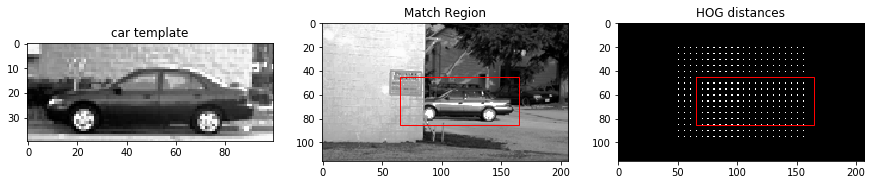

Imatge numero:  17


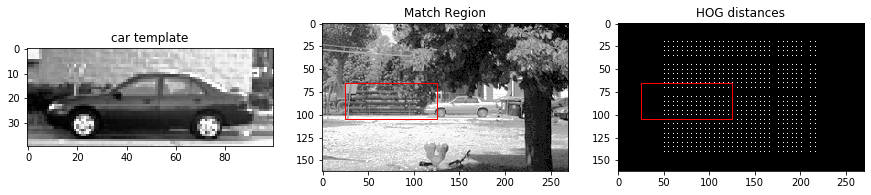

Imatge numero:  18


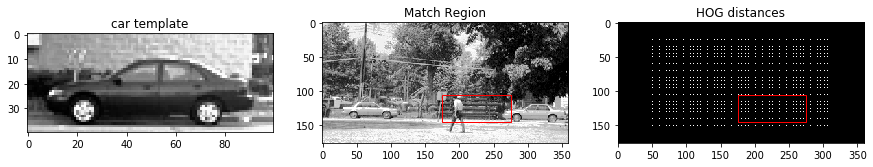

Imatge numero:  19


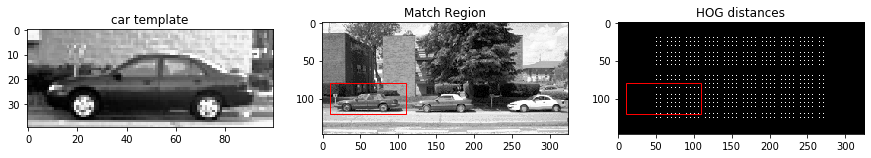

Imatge numero:  20


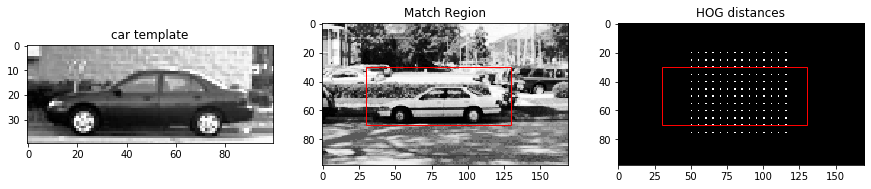

Imatge numero:  21


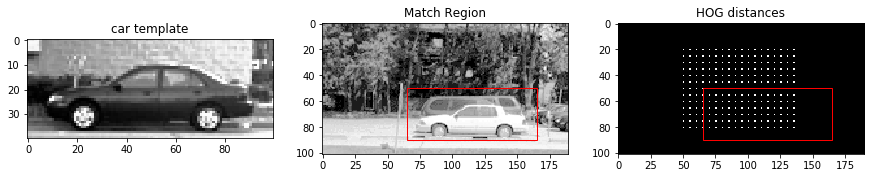

Imatge numero:  22


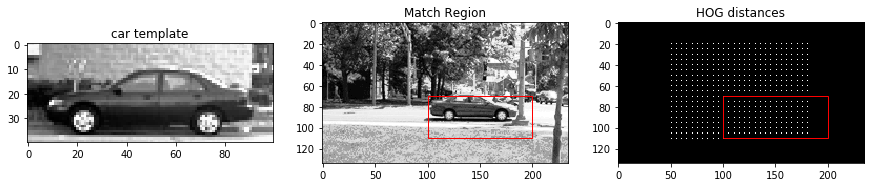

Imatge numero:  23


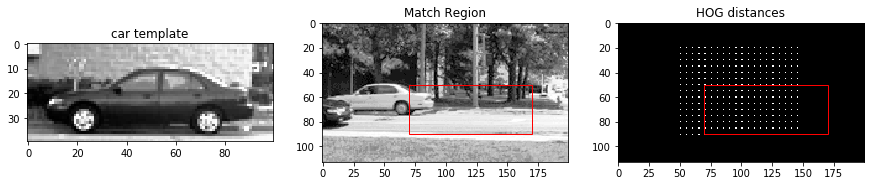

Imatge numero:  24


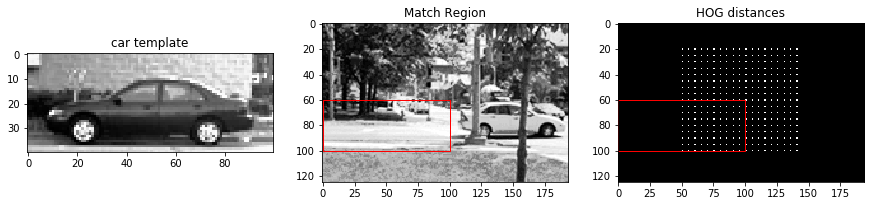

Imatge numero:  25


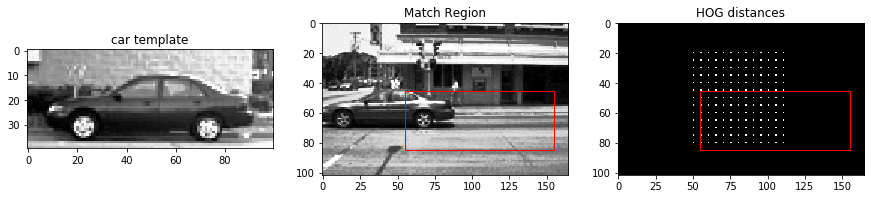

Imatge numero:  26


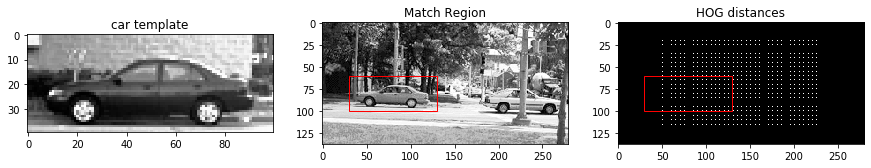

Imatge numero:  27


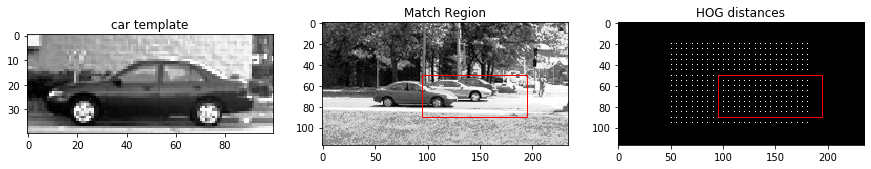

Imatge numero:  28


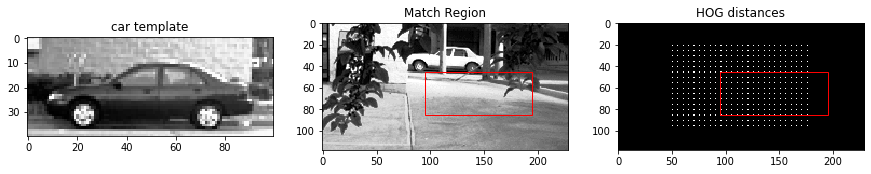

Imatge numero:  29


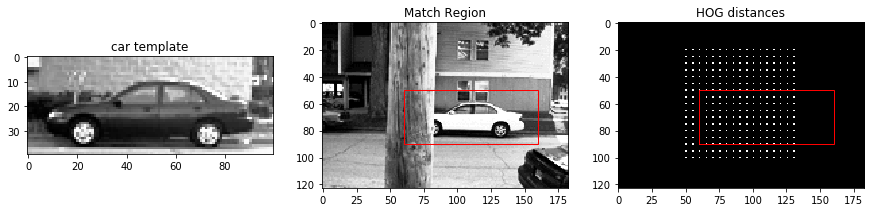

Imatge numero:  30


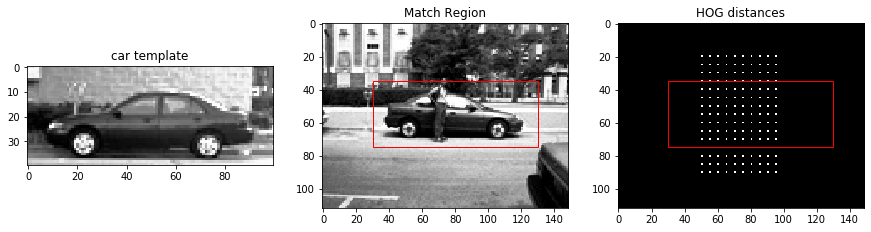

Imatge numero:  31


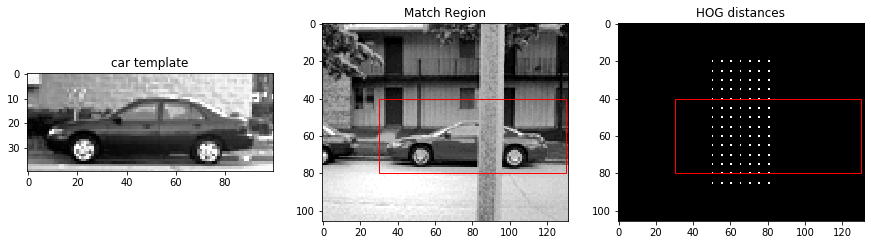

Imatge numero:  32


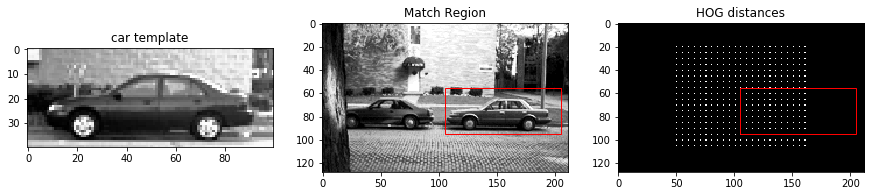

Imatge numero:  33


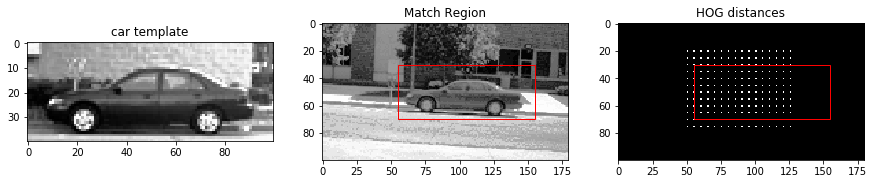

Imatge numero:  34


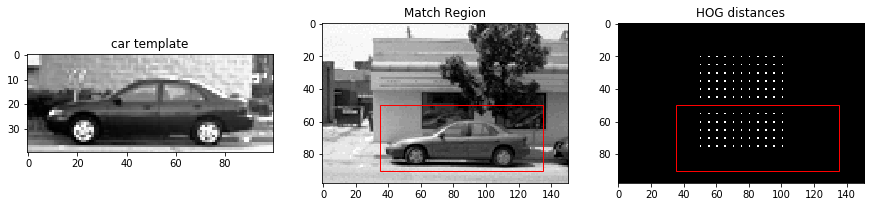

Imatge numero:  35


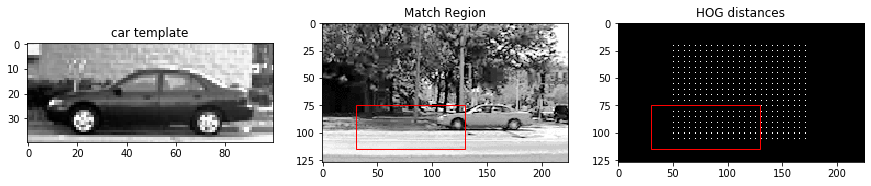

Imatge numero:  36


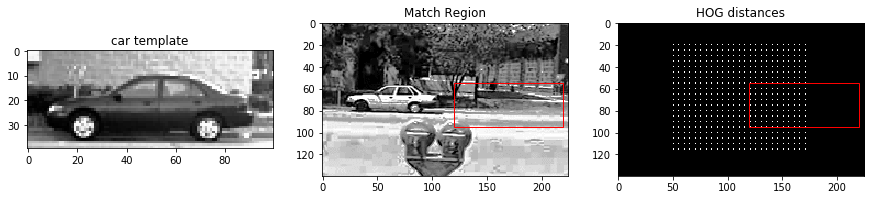

Imatge numero:  37


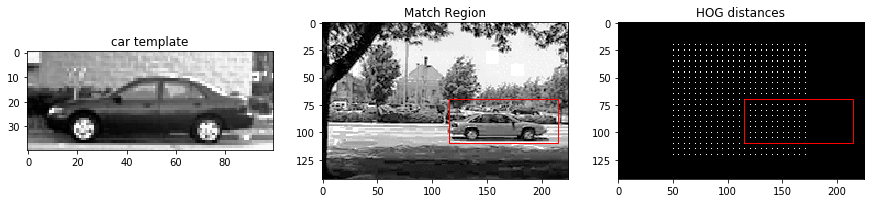

Imatge numero:  38


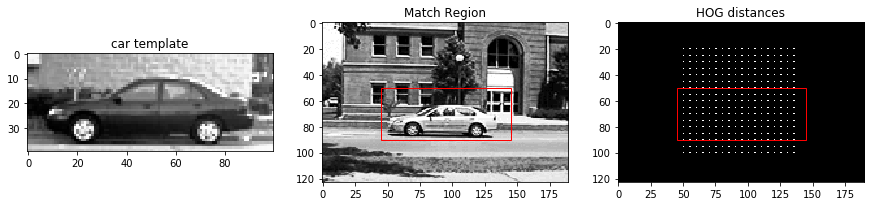

Imatge numero:  39


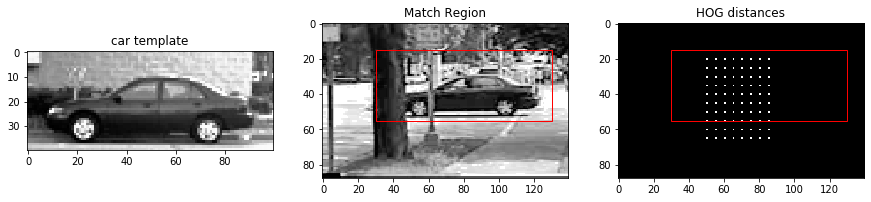

Imatge numero:  40


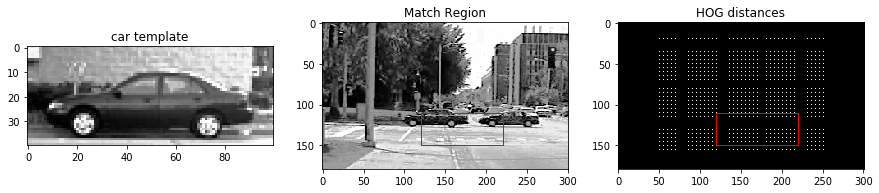

Imatge numero:  41


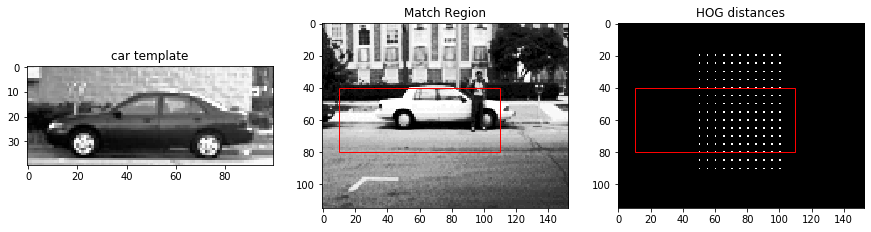

Imatge numero:  42


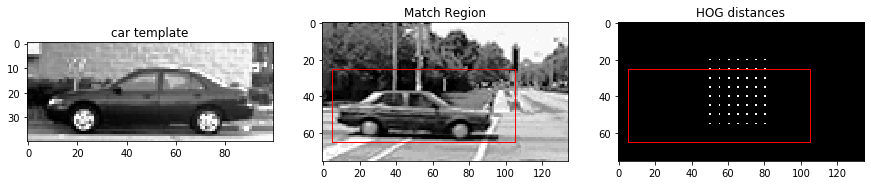

Imatge numero:  43


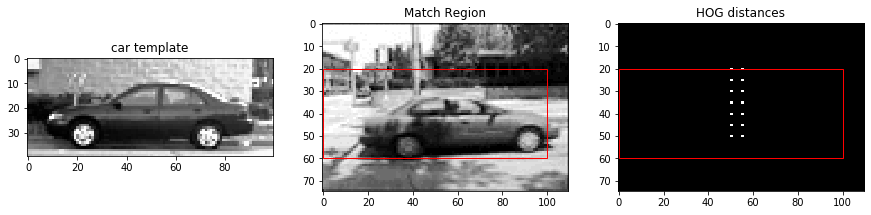

Imatge numero:  44


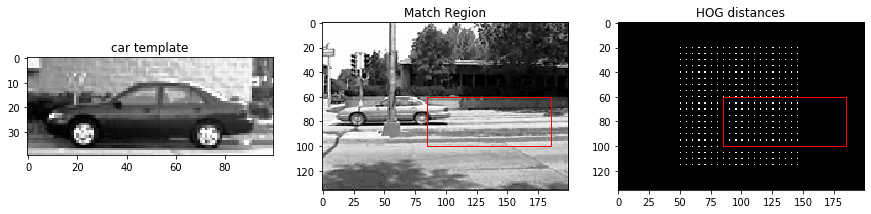

Imatge numero:  45


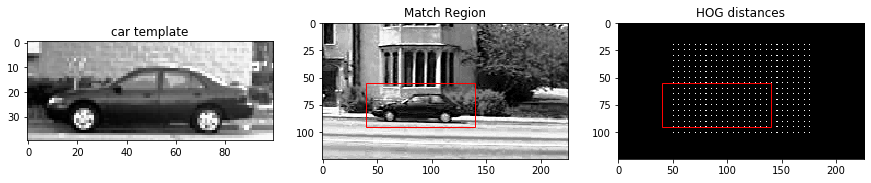

Imatge numero:  46


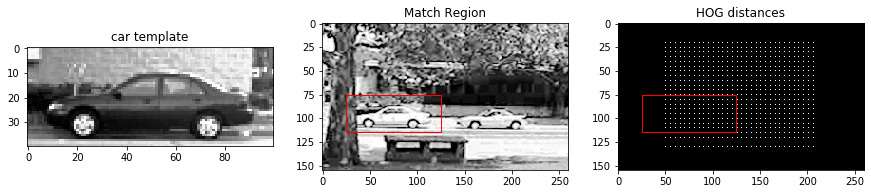

Imatge numero:  47


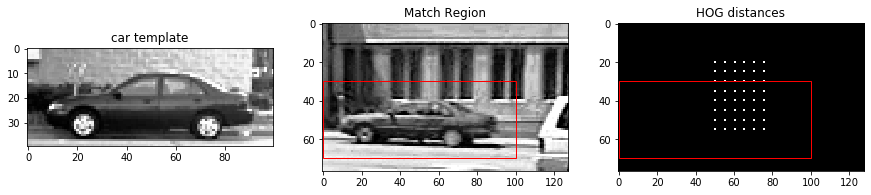

Imatge numero:  48


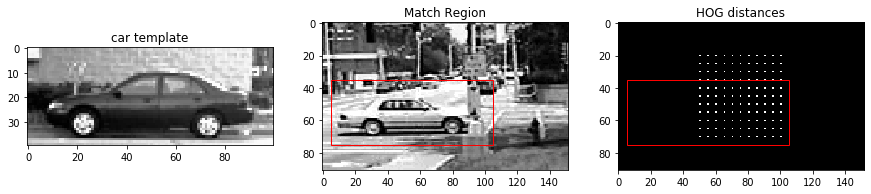

Imatge numero:  49


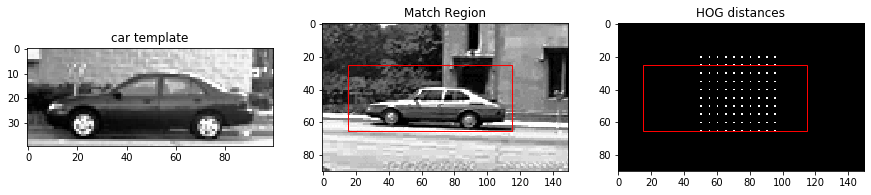

Imatge numero:  50


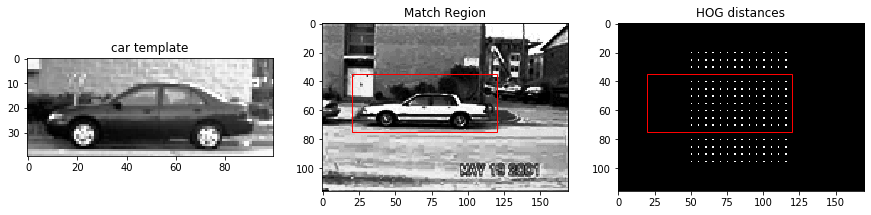

Imatge numero:  51


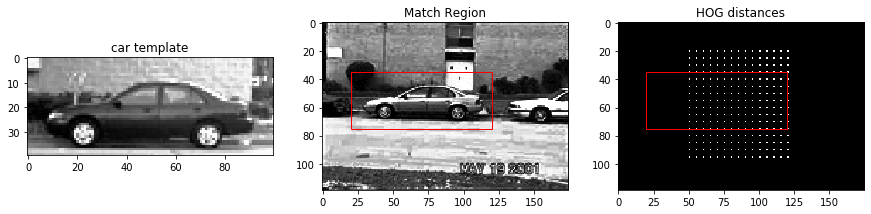

Imatge numero:  52


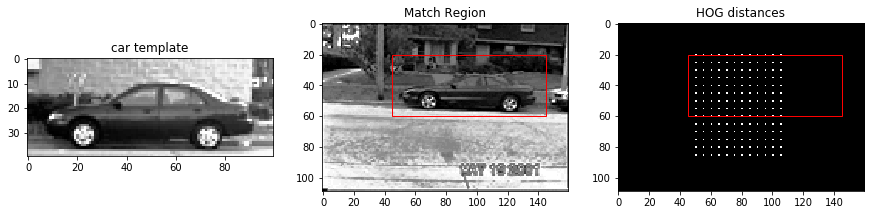

Imatge numero:  53


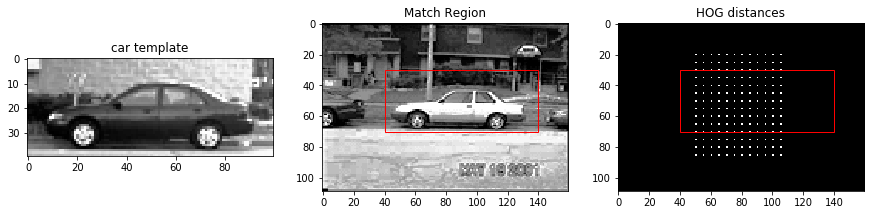

Imatge numero:  54


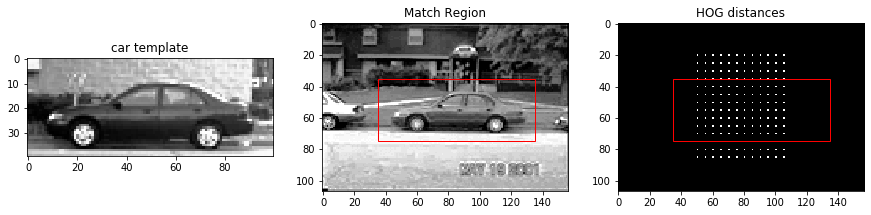

Imatge numero:  55


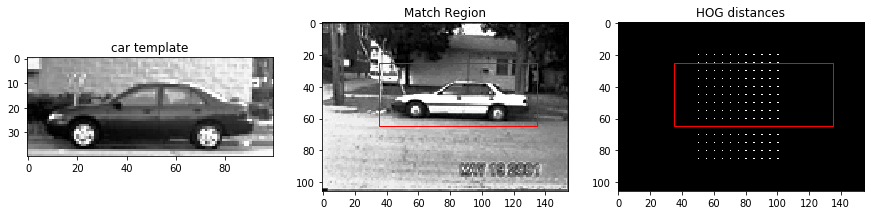

Imatge numero:  56


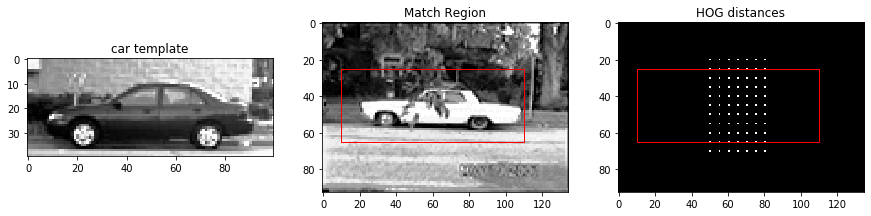

Imatge numero:  57


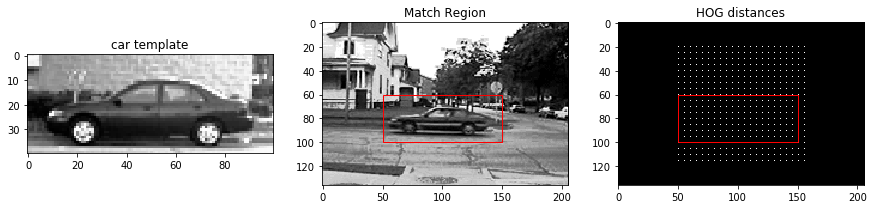

Imatge numero:  58


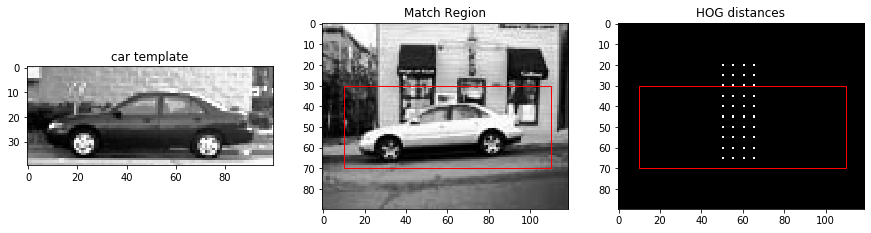

Imatge numero:  59


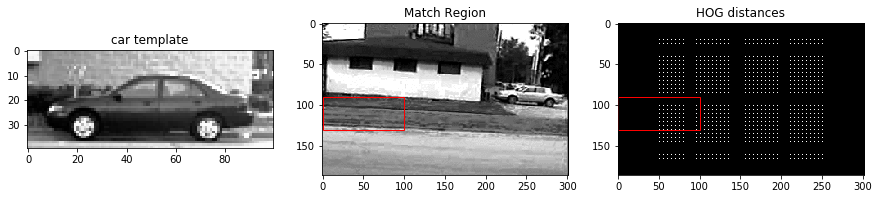

Imatge numero:  60


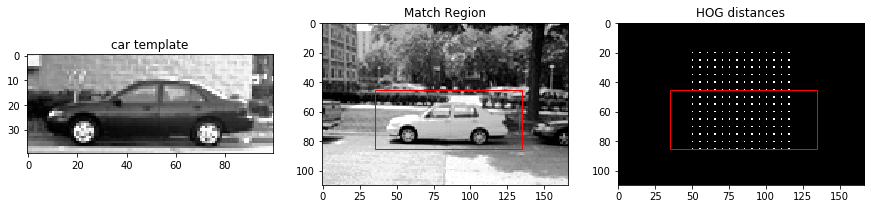

Imatge numero:  61


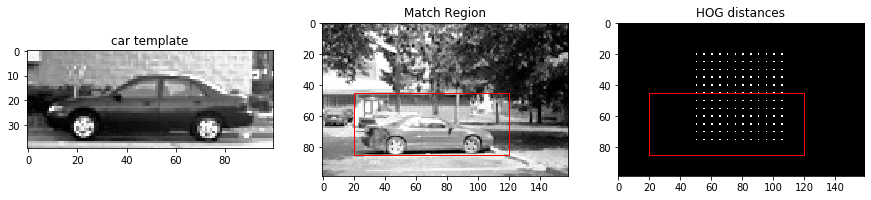

Imatge numero:  62


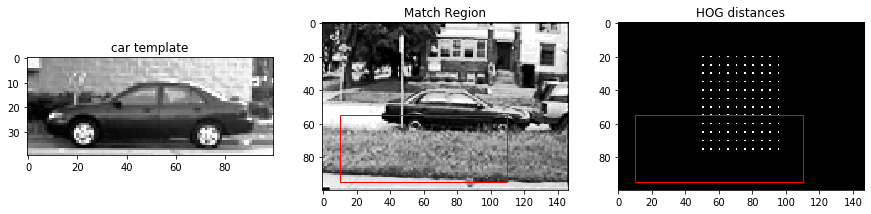

Imatge numero:  63


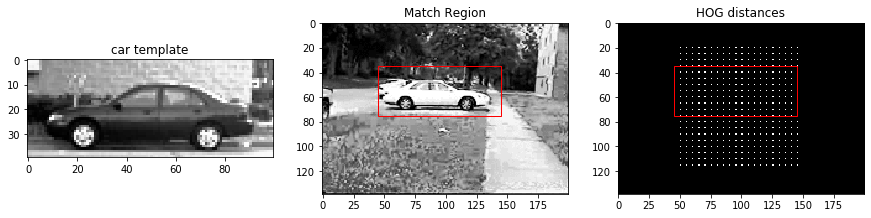

Imatge numero:  64


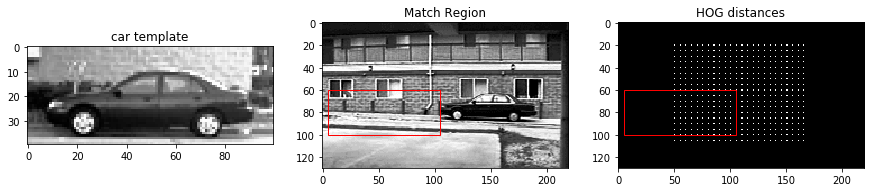

Imatge numero:  65


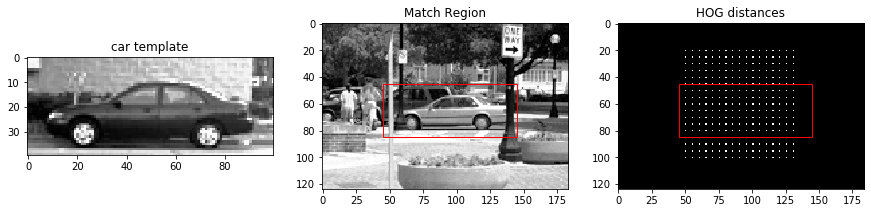

Imatge numero:  66


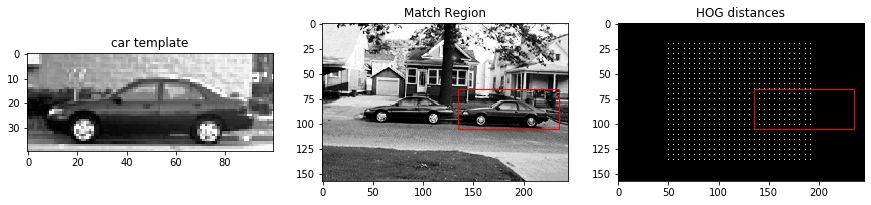

Imatge numero:  67


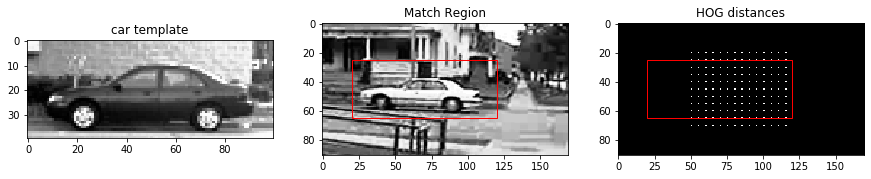

Imatge numero:  68


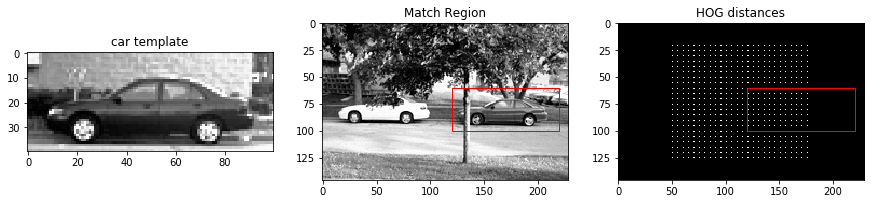

Imatge numero:  69


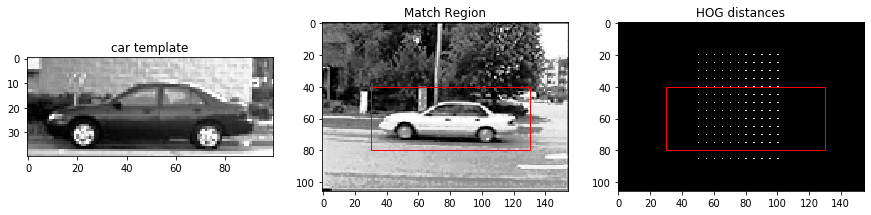

Imatge numero:  70


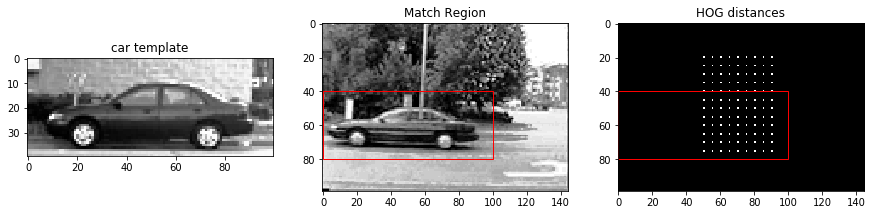

Imatge numero:  71


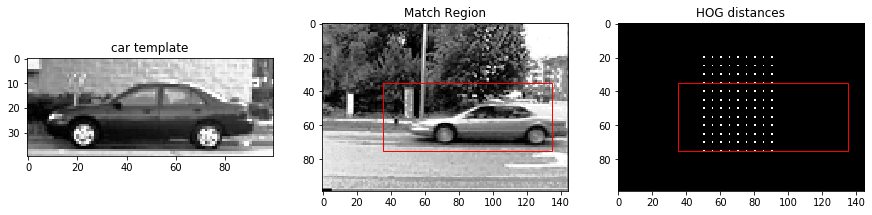

Imatge numero:  72


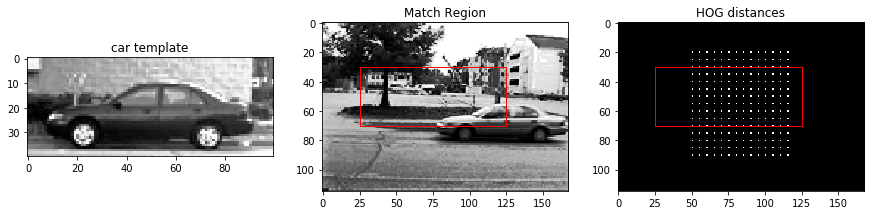

Imatge numero:  73


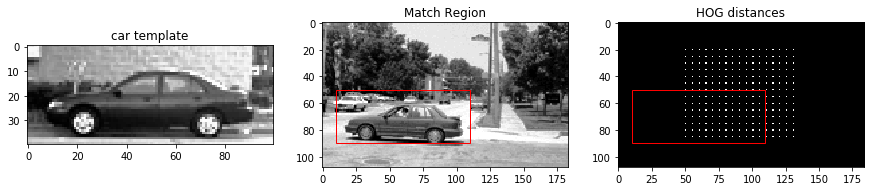

Imatge numero:  74


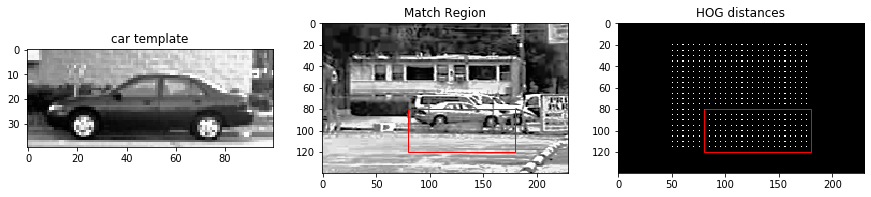

Imatge numero:  75


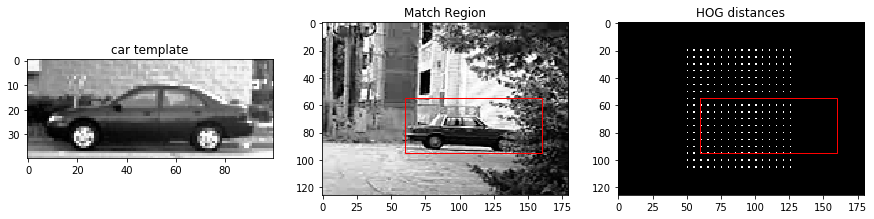

Imatge numero:  76


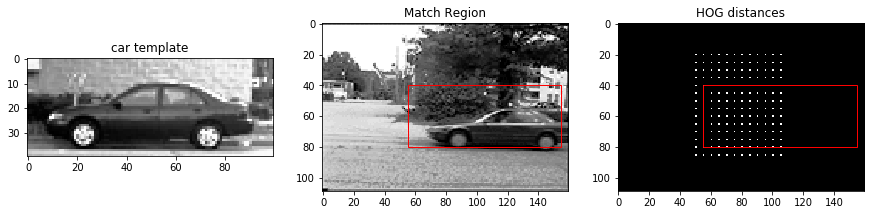

Imatge numero:  77


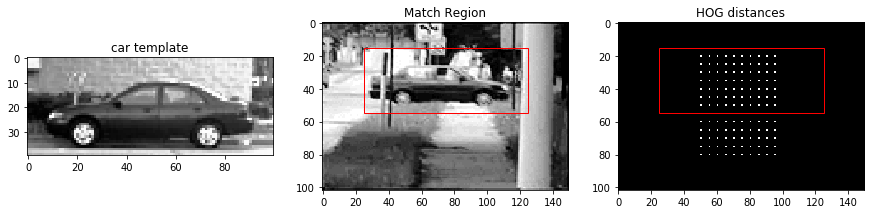

Imatge numero:  78


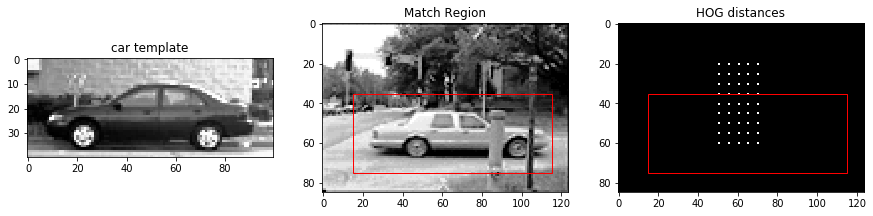

Imatge numero:  79


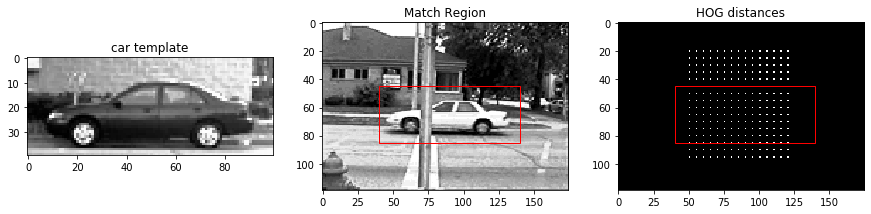

Imatge numero:  80


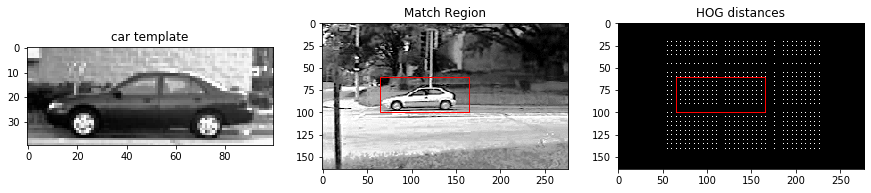

Imatge numero:  81


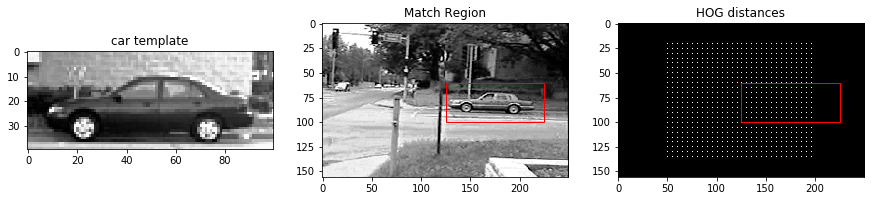

Imatge numero:  82


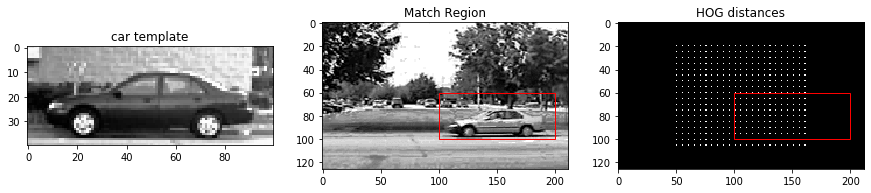

Imatge numero:  83


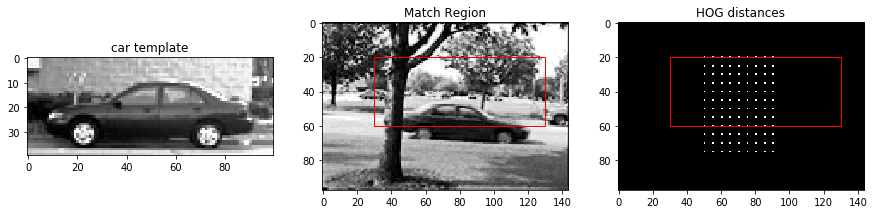

Imatge numero:  84


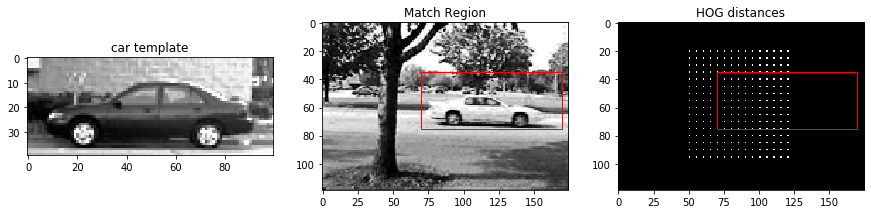

Imatge numero:  85


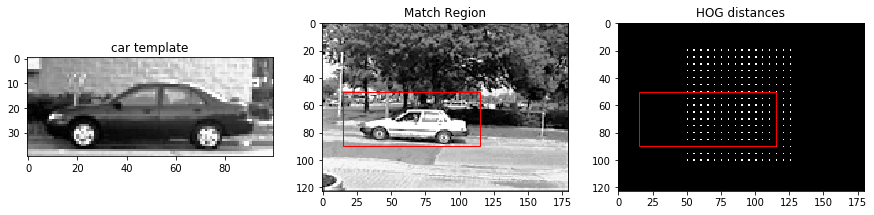

Imatge numero:  86


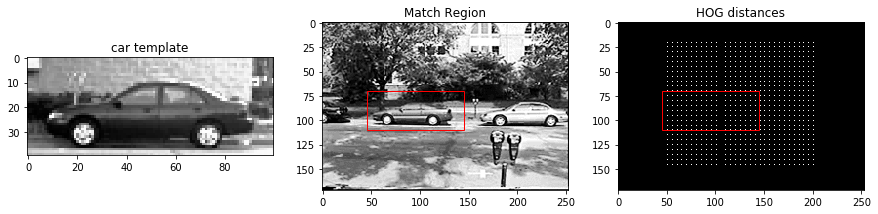

Imatge numero:  87


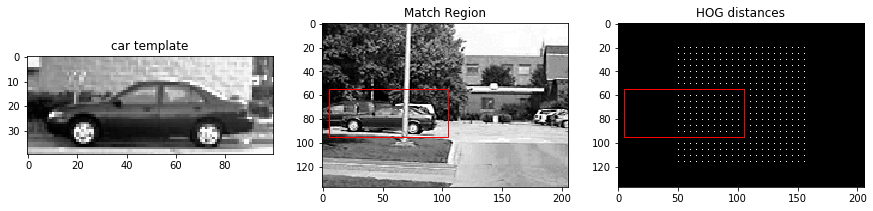

Imatge numero:  88


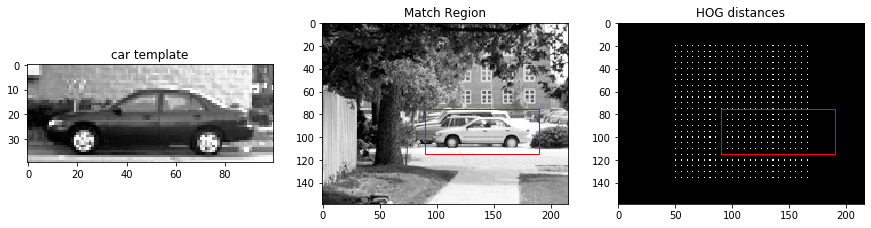

Imatge numero:  89


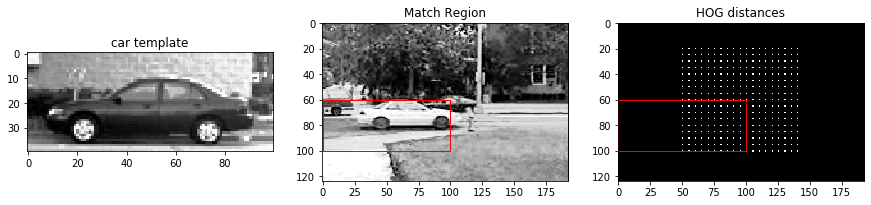

Imatge numero:  90


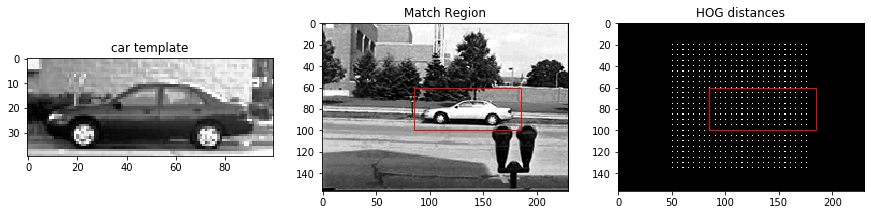

Imatge numero:  91


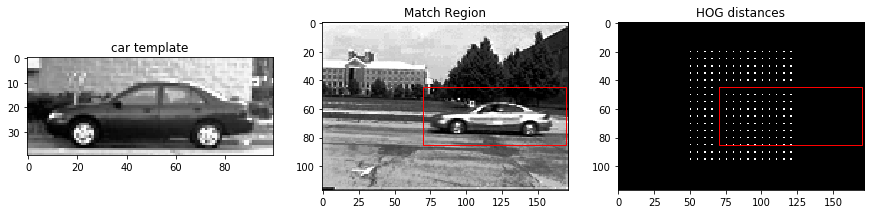

Imatge numero:  92


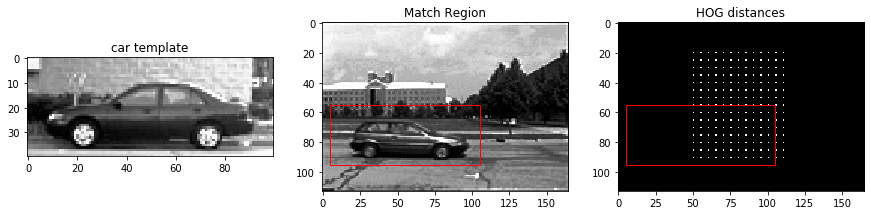

Imatge numero:  93


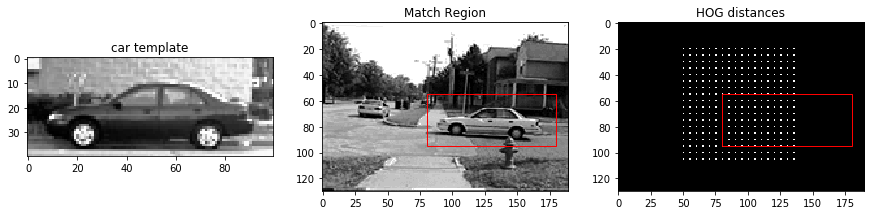

Imatge numero:  94


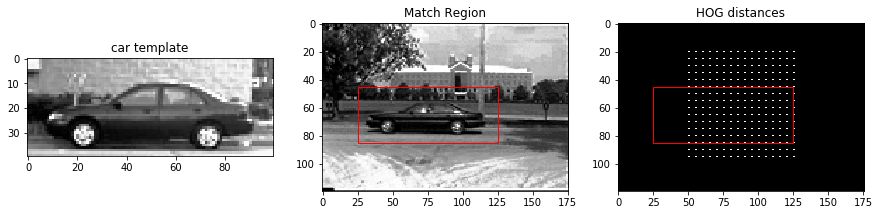

Imatge numero:  95


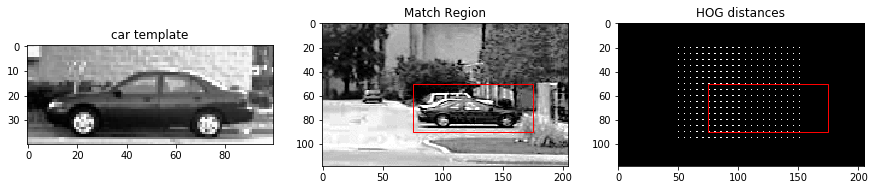

Imatge numero:  96


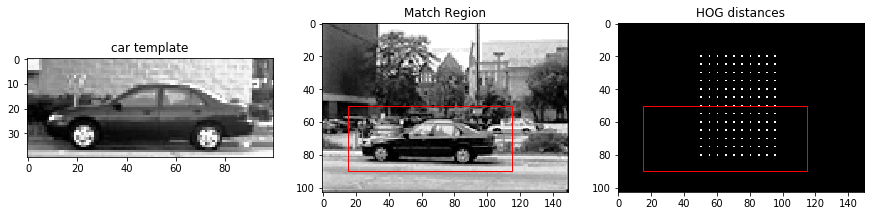

Imatge numero:  97


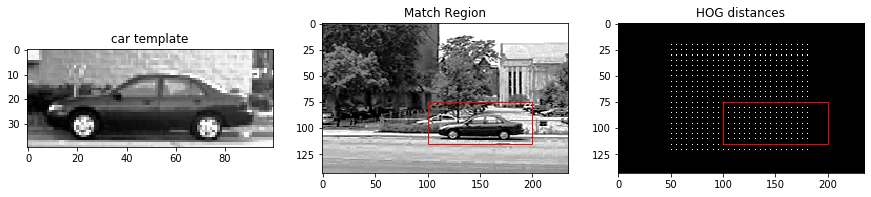

Imatge numero:  98


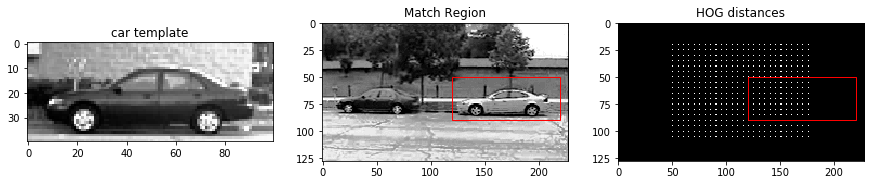

Imatge numero:  99


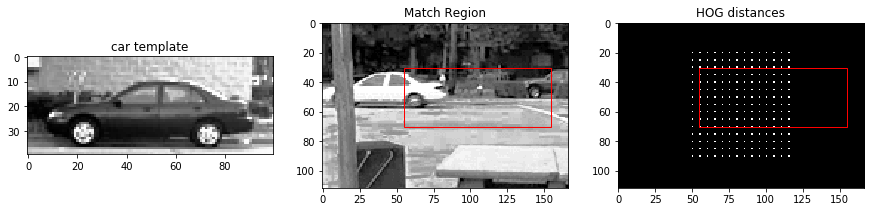

Imatge numero:  100


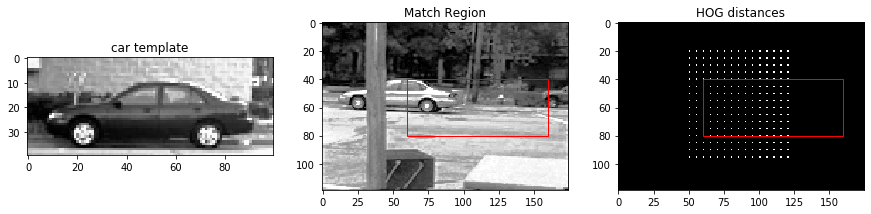

Imatge numero:  101


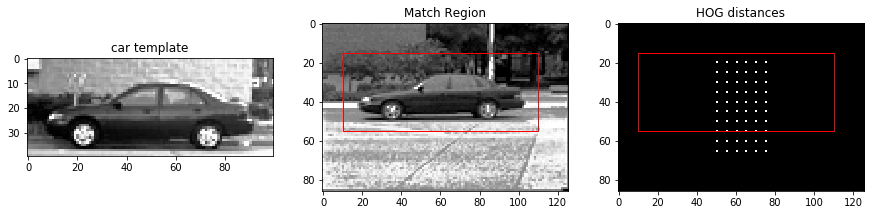

Imatge numero:  102


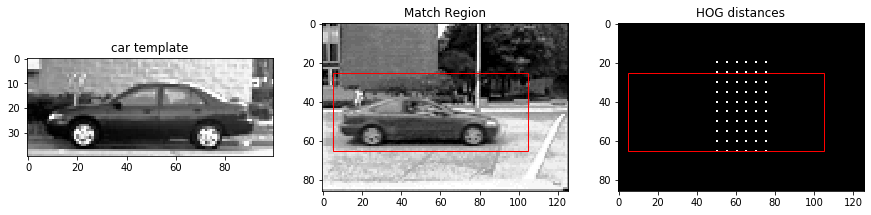

Imatge numero:  103


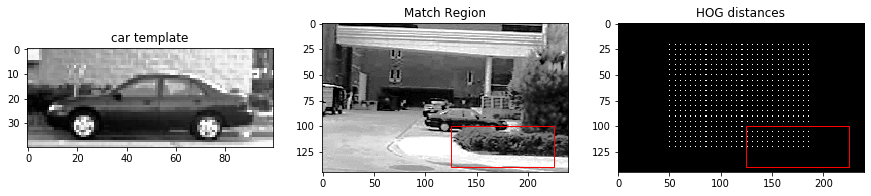

Imatge numero:  104


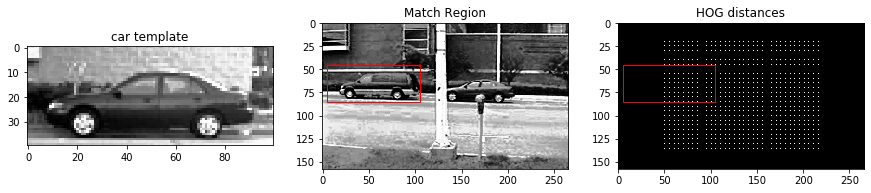

Imatge numero:  105


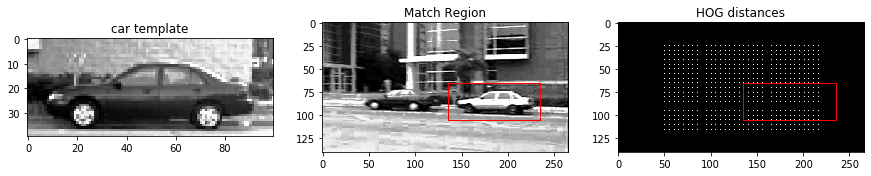

Imatge numero:  106


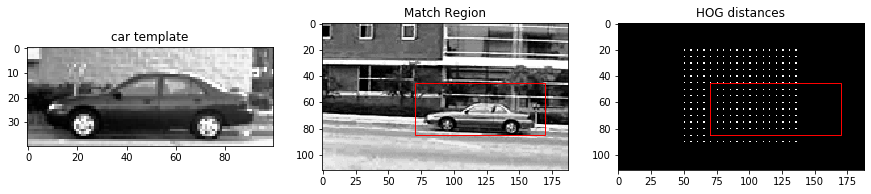

Imatge numero:  107


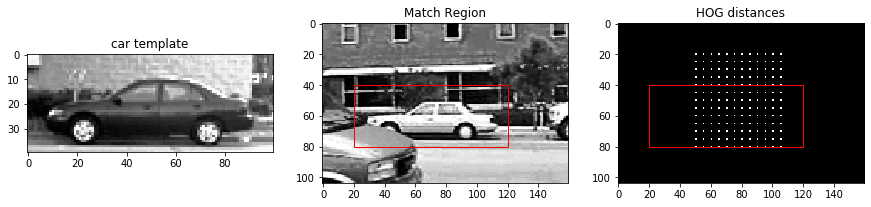

Imatge numero:  108


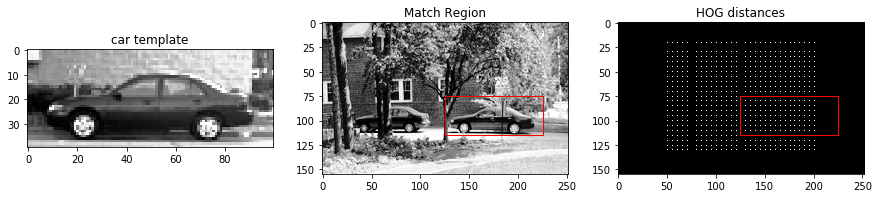

Imatge numero:  109


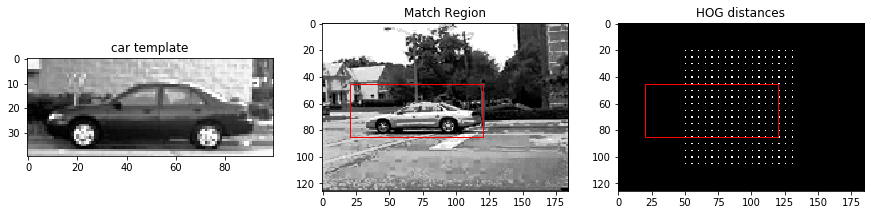

Imatge numero:  110


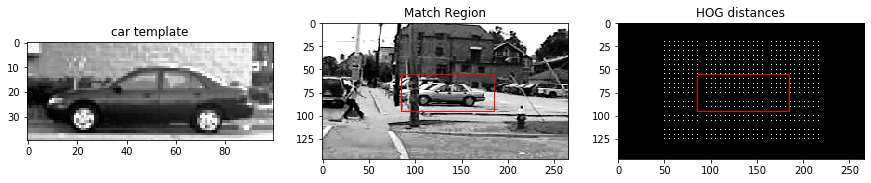

Imatge numero:  111


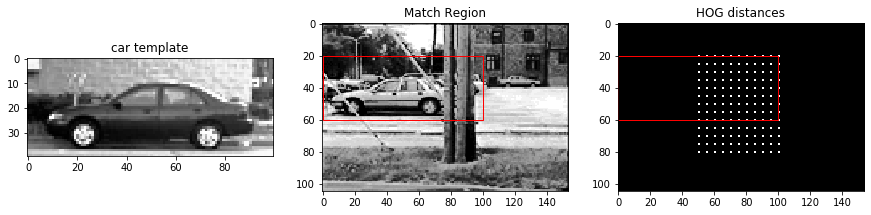

Imatge numero:  112


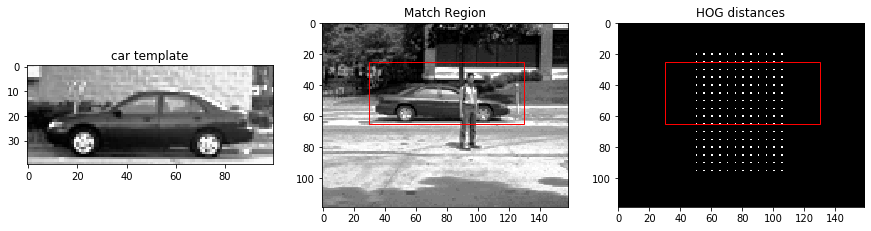

Imatge numero:  113


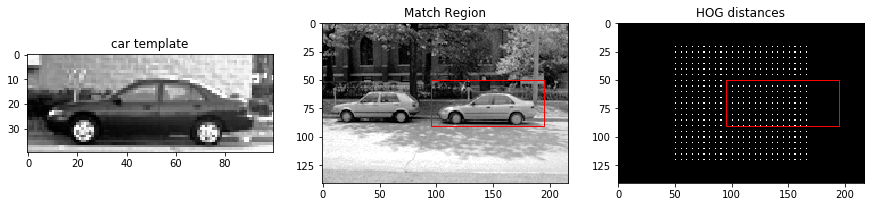

Imatge numero:  114


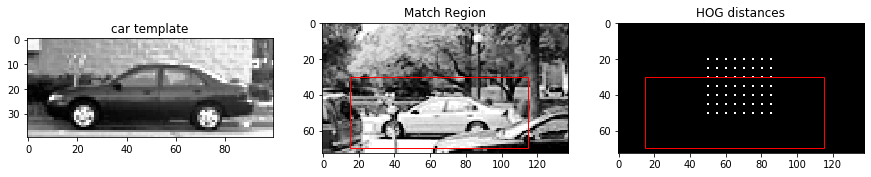

Imatge numero:  115


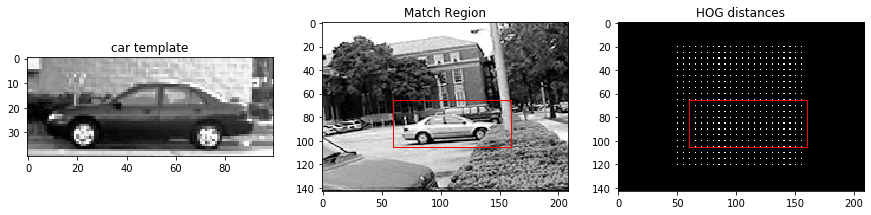

Imatge numero:  116


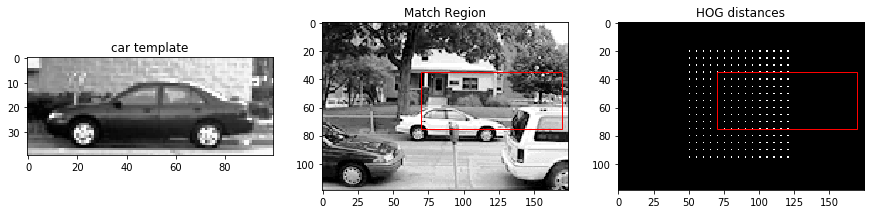

Imatge numero:  117


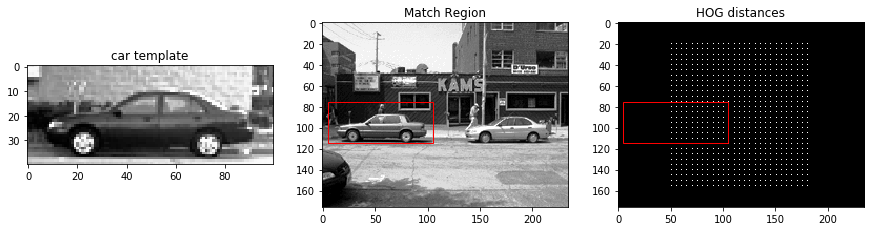

Imatge numero:  118


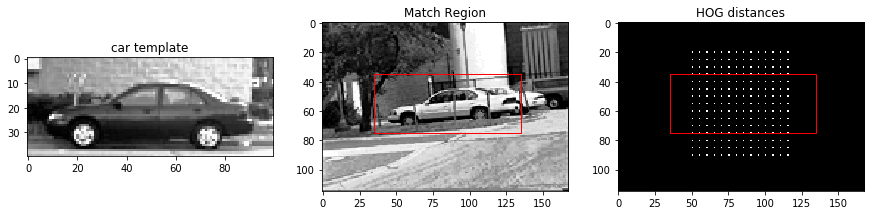

Imatge numero:  119


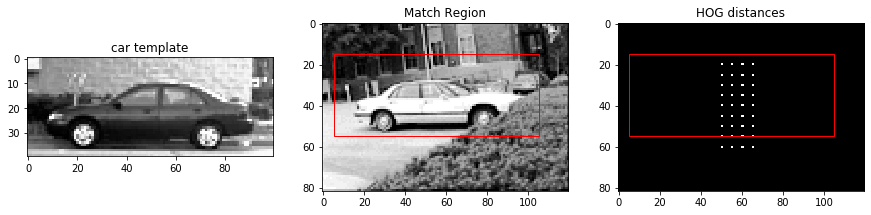

Imatge numero:  120


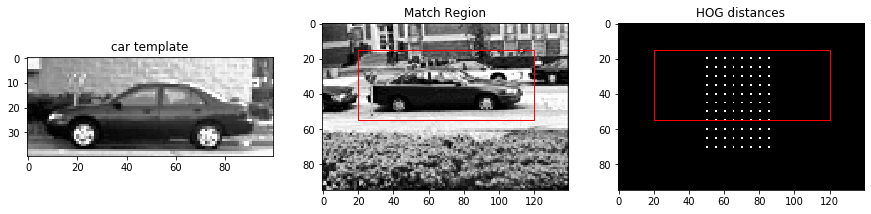

Imatge numero:  121


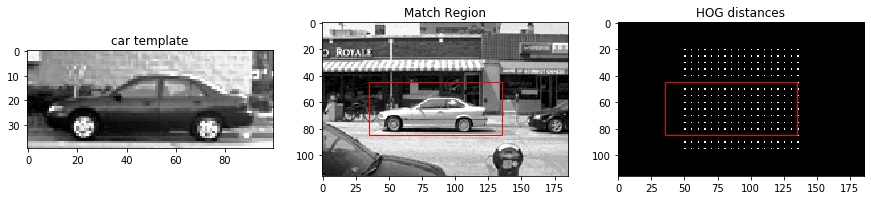

Imatge numero:  122


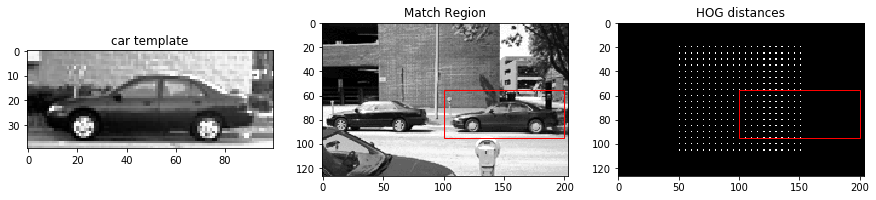

Imatge numero:  123


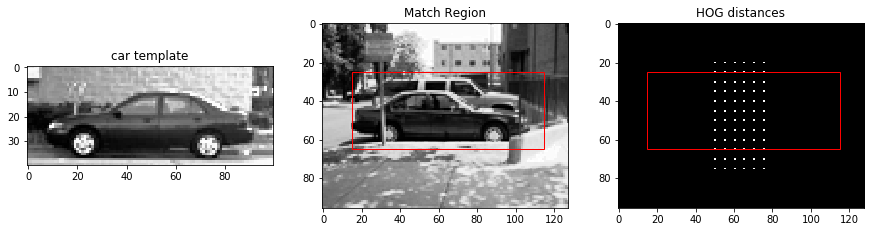

Imatge numero:  124


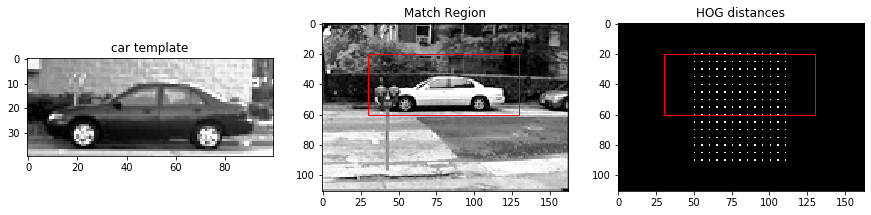

Imatge numero:  125


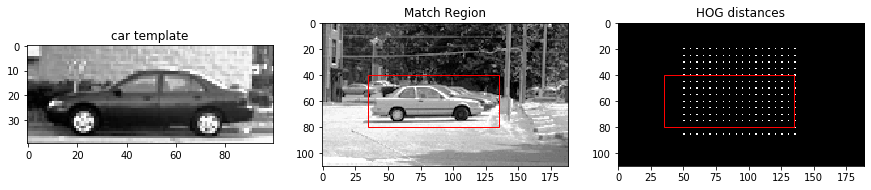

Imatge numero:  126


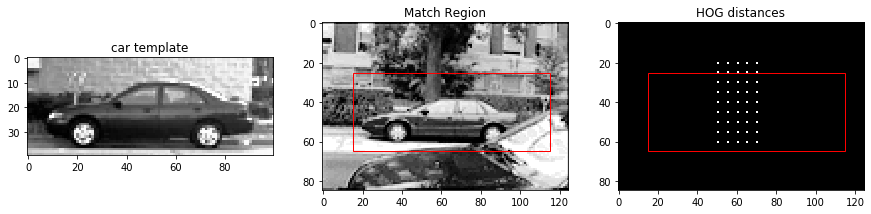

Imatge numero:  127


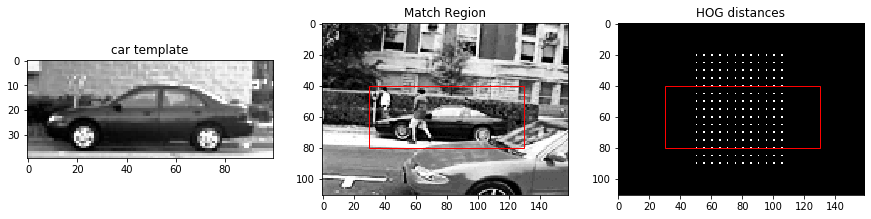

Imatge numero:  128


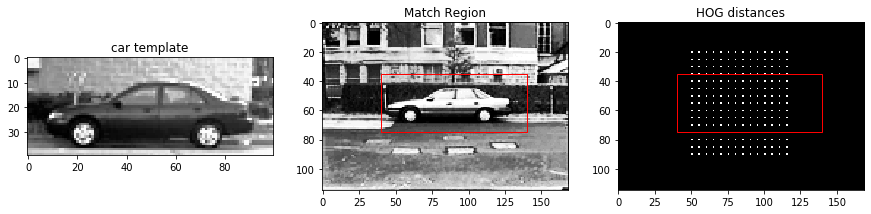

Imatge numero:  129


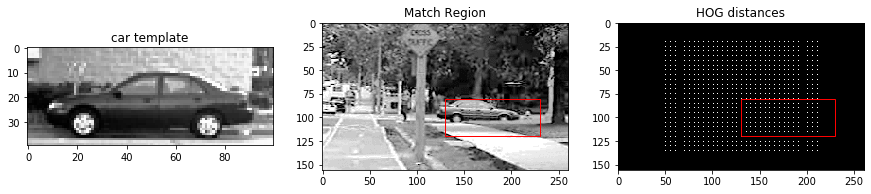

Imatge numero:  130


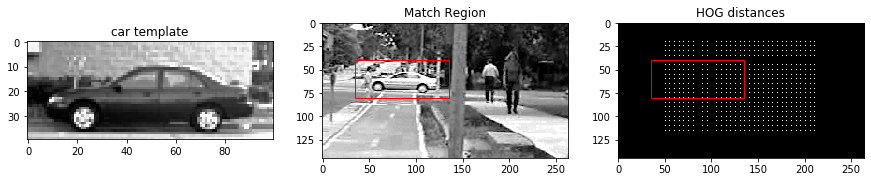

Imatge numero:  131


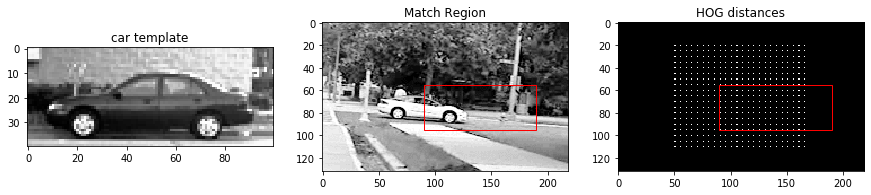

Imatge numero:  132


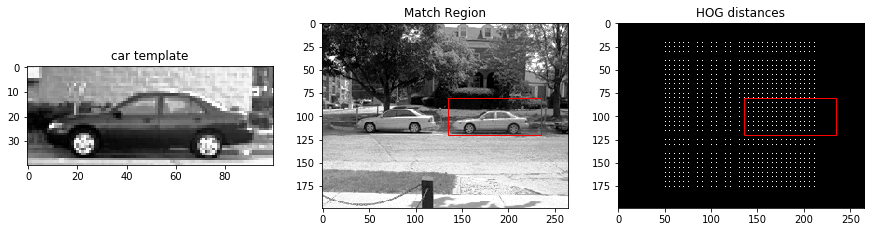

Imatge numero:  133


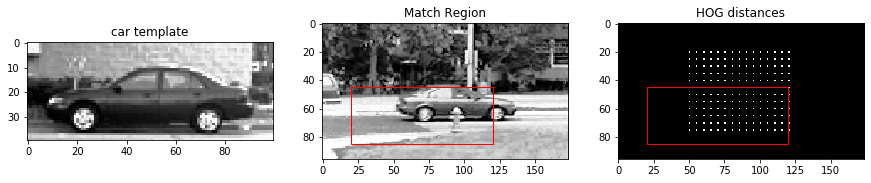

Imatge numero:  134


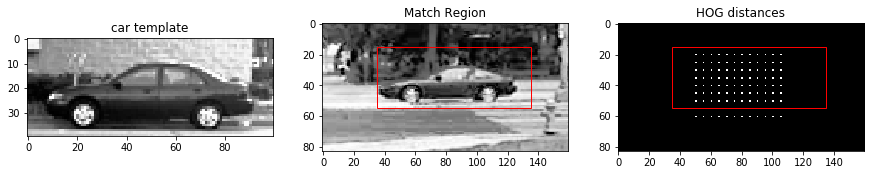

Imatge numero:  135


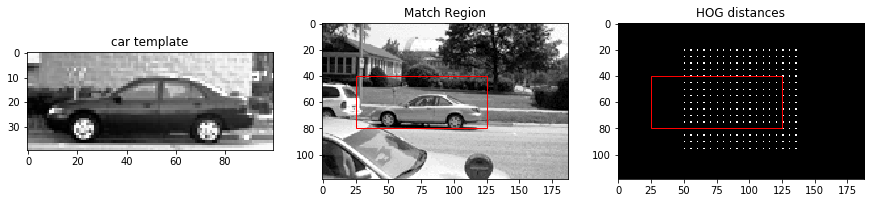

Imatge numero:  136


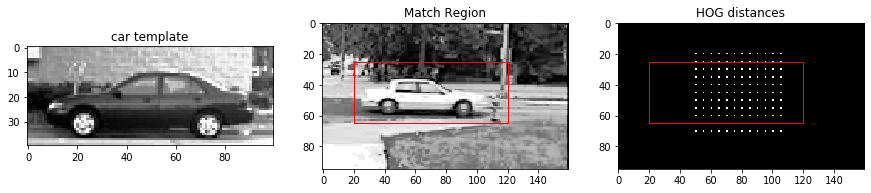

Imatge numero:  137


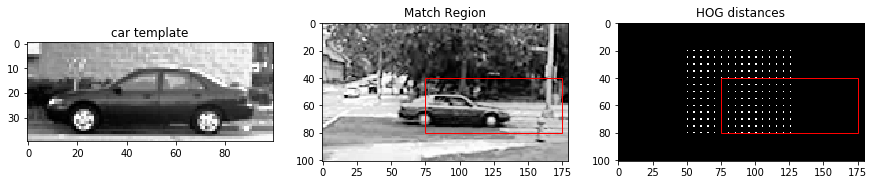

Imatge numero:  138


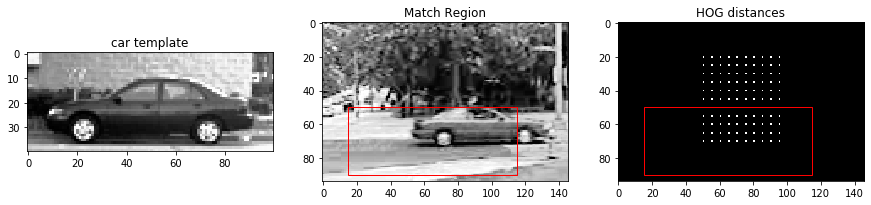

Imatge numero:  139


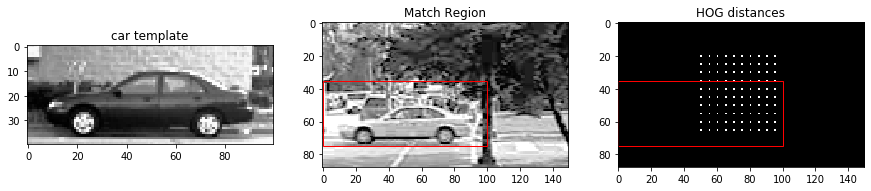

Imatge numero:  140


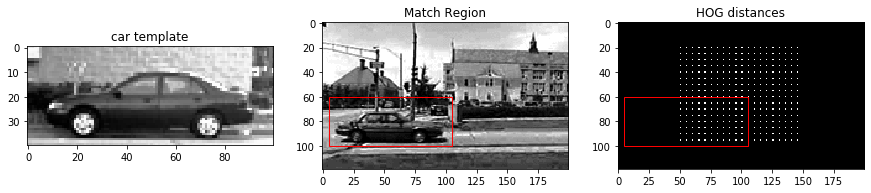

Imatge numero:  141


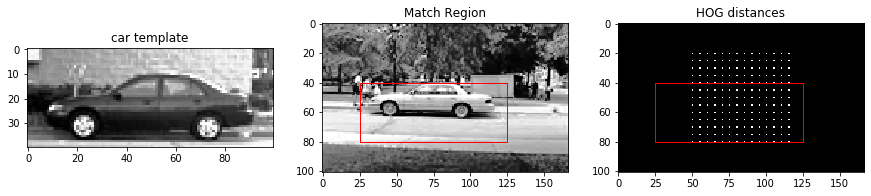

Imatge numero:  142


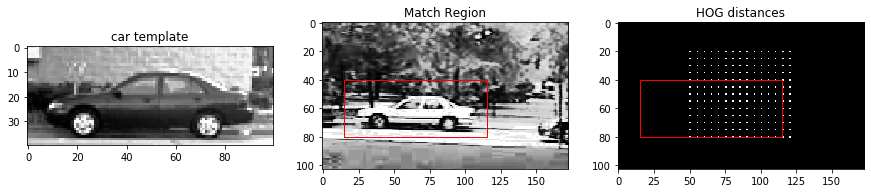

Imatge numero:  143


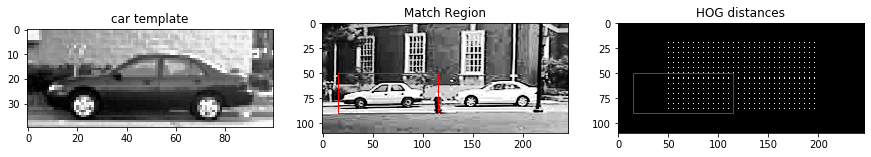

Imatge numero:  144


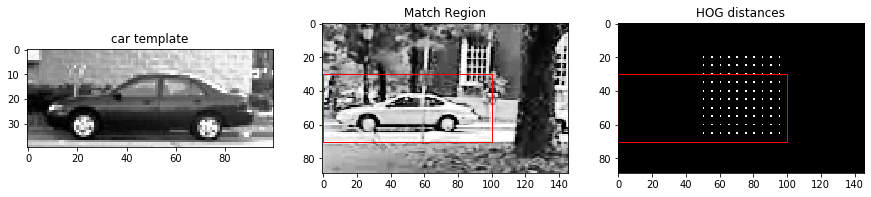

Imatge numero:  145


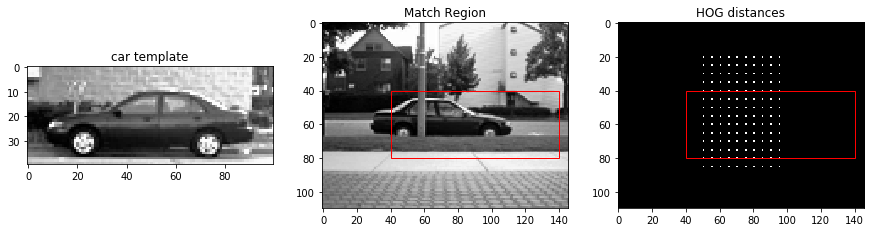

Imatge numero:  146


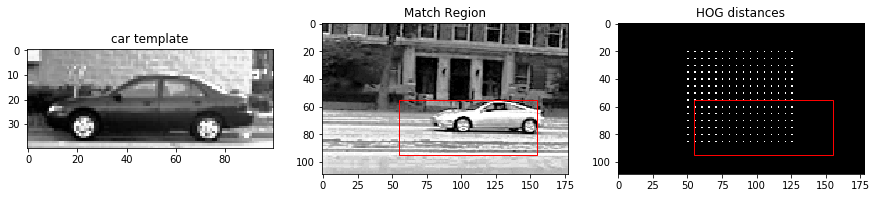

Imatge numero:  147


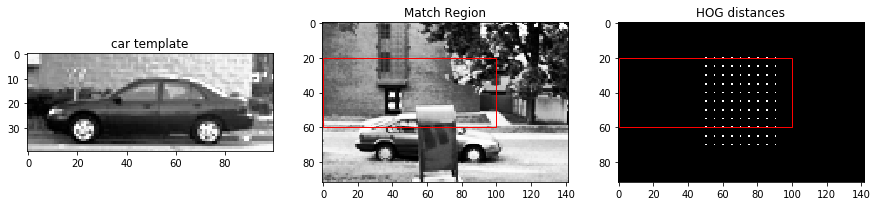

Imatge numero:  148


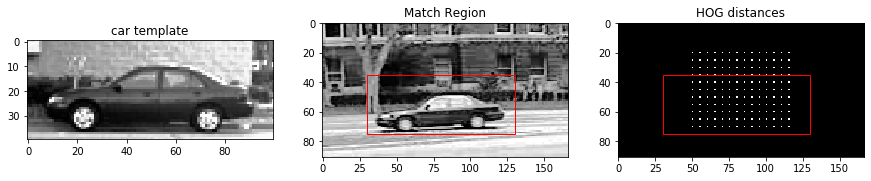

Imatge numero:  149


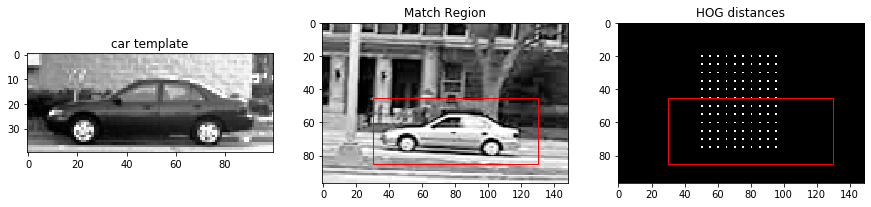

Imatge numero:  150


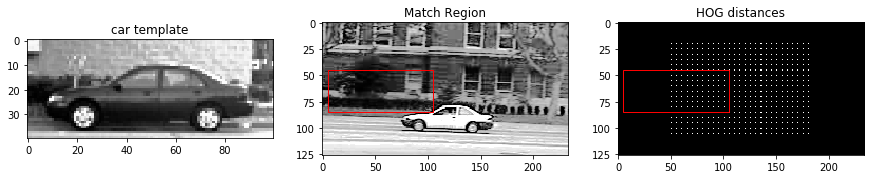

Imatge numero:  151


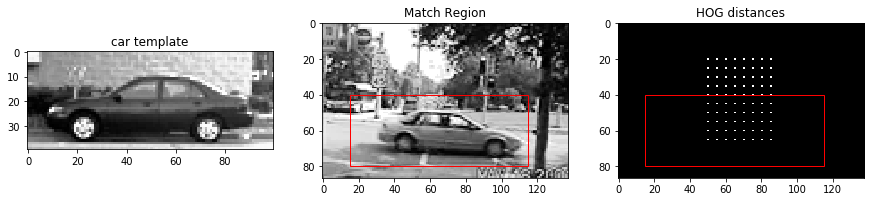

Imatge numero:  152


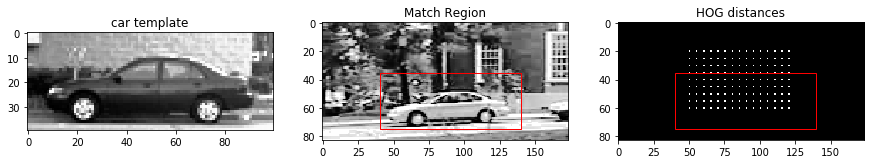

Imatge numero:  153


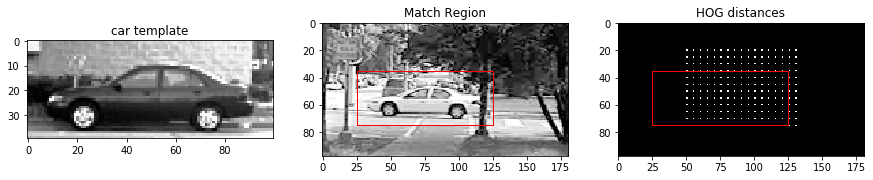

Imatge numero:  154


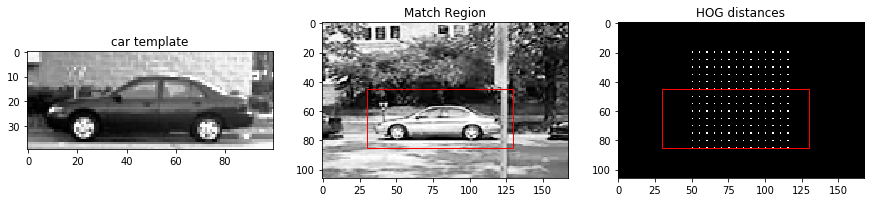

Imatge numero:  155


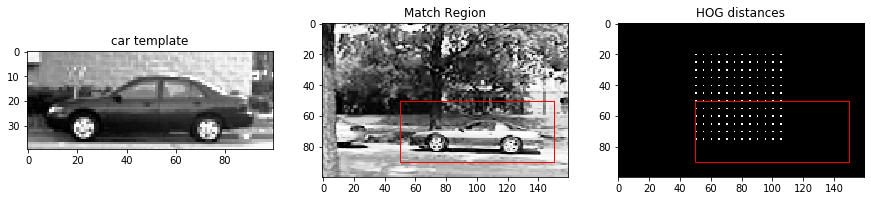

Imatge numero:  156


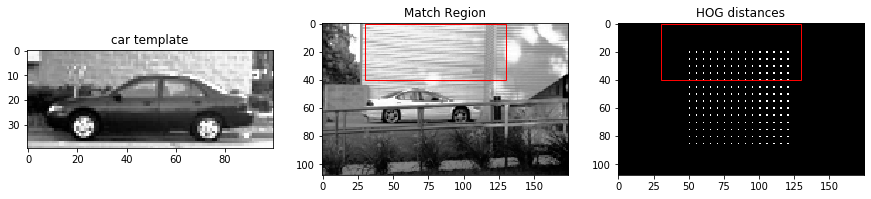

Imatge numero:  157


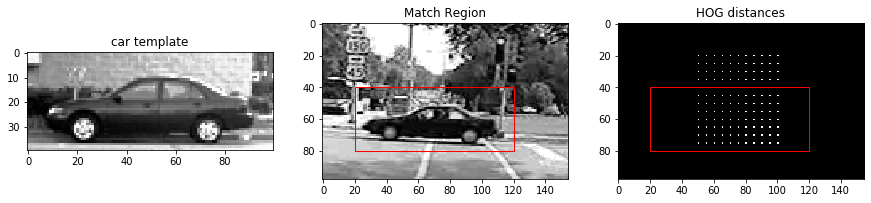

Imatge numero:  158


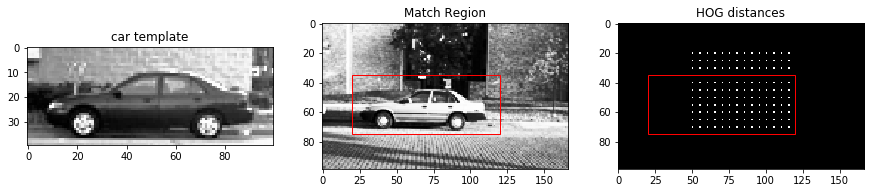

Imatge numero:  159


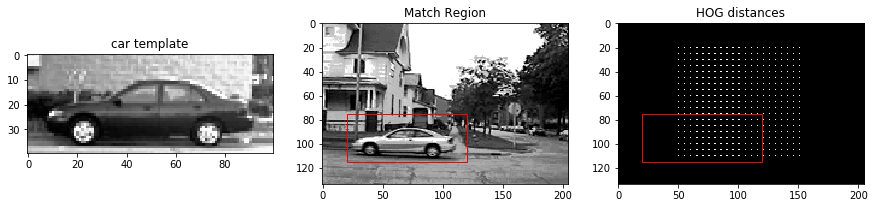

Imatge numero:  160


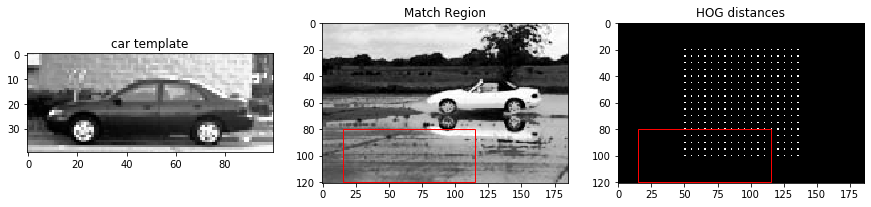

Imatge numero:  161


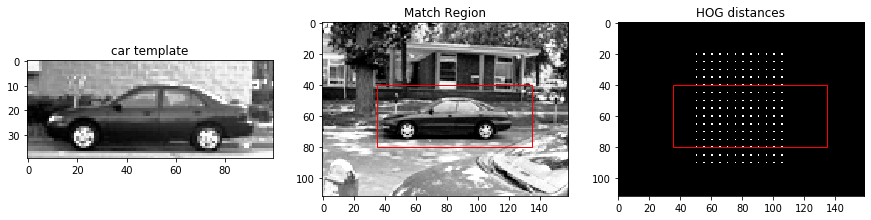

Imatge numero:  162


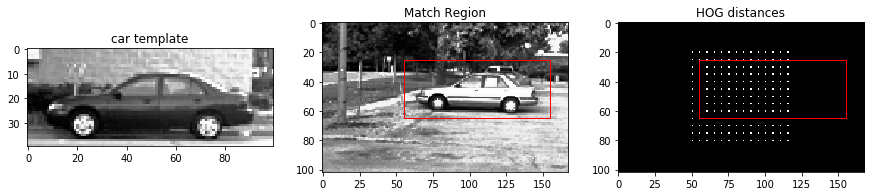

Imatge numero:  163


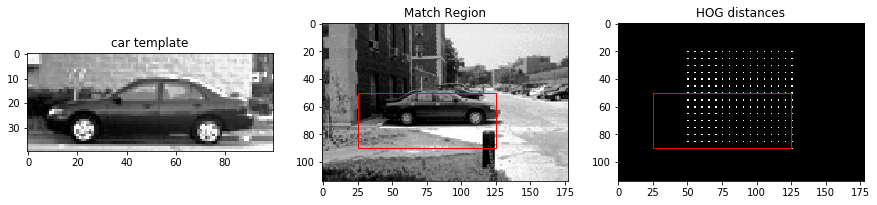

Imatge numero:  164


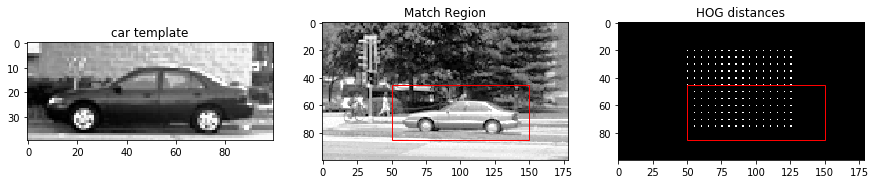

Imatge numero:  165


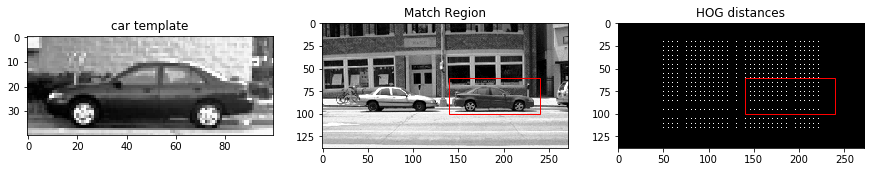

Imatge numero:  166


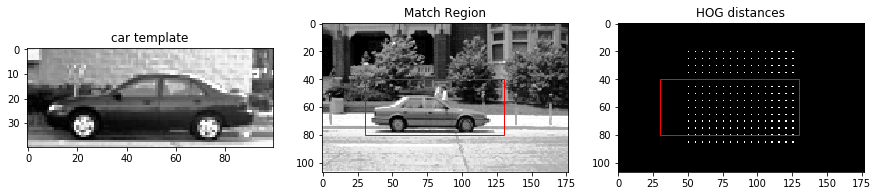

Imatge numero:  167


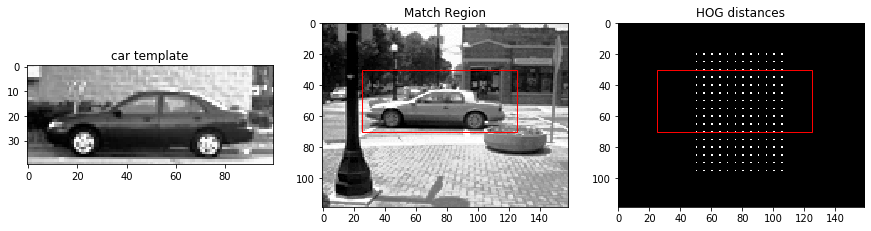

Imatge numero:  168


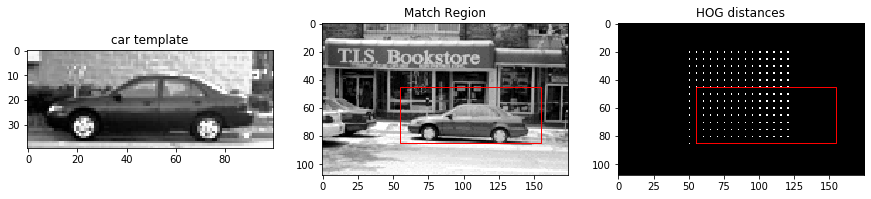

Imatge numero:  169


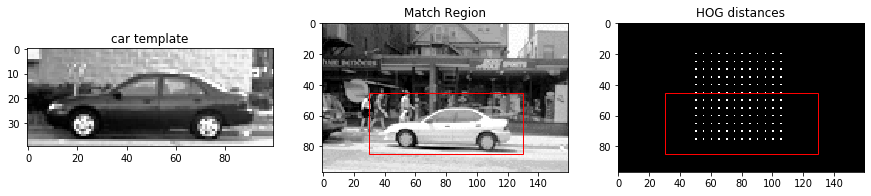

In [12]:
ic = io.ImageCollection('./images/TestImages/*.pgm')
car = io.imread('./images/car_template.png')
for i,im in enumerate(ic):
    print("Imatge numero: ", i)
    compare_hogs(car, im)

## ANSWER

c) 
We use de euclidean distance

d) 
The algorithm can only find 129 correct coincidences in a total of 170 car images. However, there are some nearly coincidences, but not correct position detection that we do not take it into account. In our opinion, the failures can be due to the fact that the images are obstacled by some other objects or the similarity between the template car and the image for comparison is low.

**Discussion**

HOG descriptors are used in the HOG algorithm to generate the histogram gradients of the different regions of our image. This histograms are used to identify in which directions the image is changing. 

Advantage over other descriptor methods is the HOG descriptor operates on localized cells, the method upholds invariance to geometric and photometric transformations, except for object orientation

For more explanation, HOG is better than the template-based object detection because HOG is not affected by contrast, ilumantion etc.

At the same time, a disadvantage would be that sometimes would not detected objects that are in a different direction of the template


# 4.3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

In theory classes, we saw two feature extraction methods: SIFT and ORB. Let us focus on ORB.

**4.3.1** Check if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

a) Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks6.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. Define the algorithm in terms of functions in order to be able to apply it on different images. Comment the code in detail.

Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.

In [20]:
''' Visualization and ORB functions definition '''
from skimage import data
from skimage.feature import match_descriptors, ORB, plot_matches

def orb_images(img1,img2, figuresize=(20, 10)):
    
    img1 = color.rgb2gray(img1)
    img2 = color.rgb2gray(img2)
    img1 = img_as_float(img1)
    img2 = img_as_float(img2)
    
    # Extract descriptors
    descriptor_extractor = ORB(n_keypoints=500)

    descriptor_extractor.detect_and_extract(img1)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors

    descriptor_extractor.detect_and_extract(img2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors

    # Do the match of descriptors
    matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

    representation, position = plt.subplots(nrows=1, ncols=1, figsize=figuresize)
    
    plot_matches(position, img1, img2, keypoints1, keypoints2, matches)
    position.axis('off')
    position.set_title("ORB")
    plt.show()

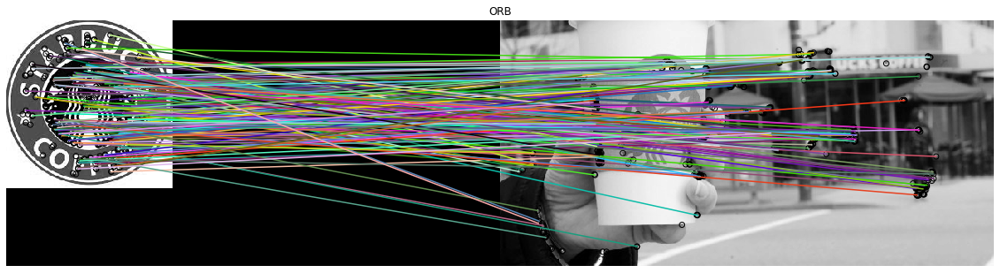

In [14]:
starbucks = io.imread('./images/starbucks.jpg')
starbucks_scene = io.imread('./images/starbucks6.jpg')

orb_images(starbucks,starbucks_scene)

b) Repeate the experiment comparing the "starbucks.jpg" image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when the algorithm works best. 

In [15]:
from queue import PriorityQueue


def compare_orb(colection, orig_img):
    orig_img_gray = color.rgb2gray(orig_img)
    orig_img_gray_f = img_as_float(orig_img_gray)

    # We will use a PQ to show in order the similarity
    q = PriorityQueue()

    # For every starbucks image in the colection
    for i in range(len(colection)):
        sb_img = colection[i]

        sb_img_gray = color.rgb2gray(sb_img)
        sb_img_gray_f = img_as_float(sb_img_gray)

        descriptor_extractor = ORB(n_keypoints=500)

        # Extract the descriptor_extractor for the original_img
        descriptor_extractor.detect_and_extract(orig_img_gray_f)
        keypoints1 = descriptor_extractor.keypoints
        descriptors1 = descriptor_extractor.descriptors

        # Extract the descriptor_extractor for the image_colection
        descriptor_extractor.detect_and_extract(sb_img_gray_f)
        keypoints2 = descriptor_extractor.keypoints
        descriptors2 = descriptor_extractor.descriptors

        matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

        data = [orig_img_gray_f, sb_img_gray_f, keypoints1, keypoints2, matches]
        q.put((-len(matches), data))

    # Plot the Images Taking into account their similarity
    while not q.empty():
        next_item = q.get()
        # Get the similarity in %
        print('Similariry: ', abs(next_item[0]/5), '%')

        data = next_item[1]
        representation, position = plt.subplots(nrows=1, ncols=1, figsize=(10, 15))

        plot_matches(position, data[0], data[1], data[2], data[3], data[4])
        position.axis('off')
        position.set_title("Original_Starbucks_Image - Starbucks_Image_Colection")
        plt.show()

Similariry:  100.0 %


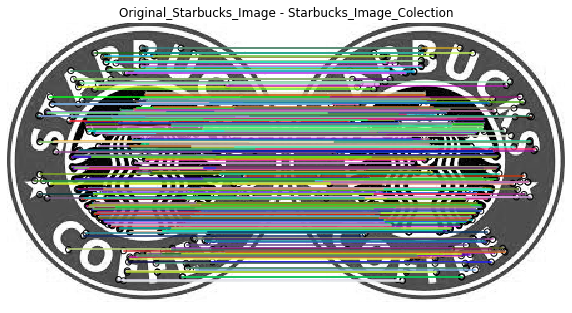

Similariry:  40.4 %


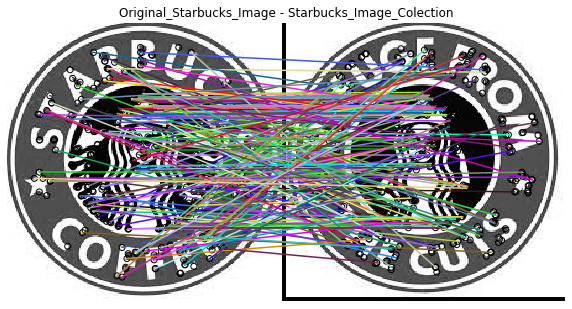

Similariry:  40.0 %


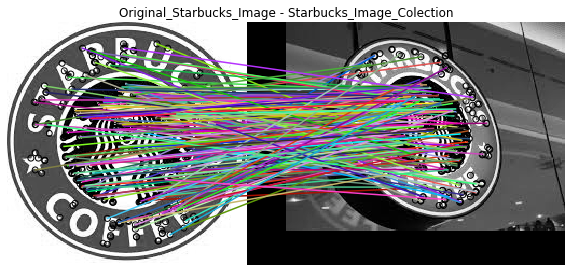

Similariry:  37.0 %


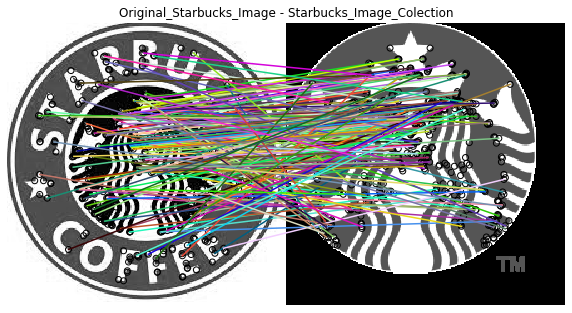

Similariry:  34.2 %


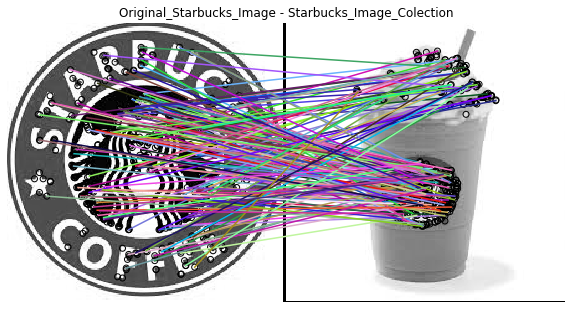

Similariry:  33.0 %


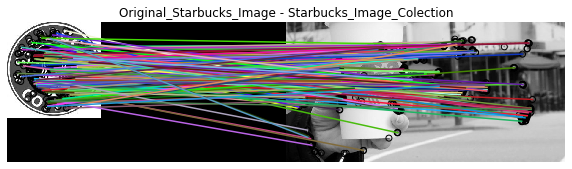

In [16]:
sb_colec = io.ImageCollection('images/starbucks*')
orig_img = io.imread('./images/starbucks.jpg')

compare_orb(sb_colec, orig_img)

c) Repeate the experiment in (b): 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

Help: To do so, you can use the function given below as example:

import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)

or

tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)

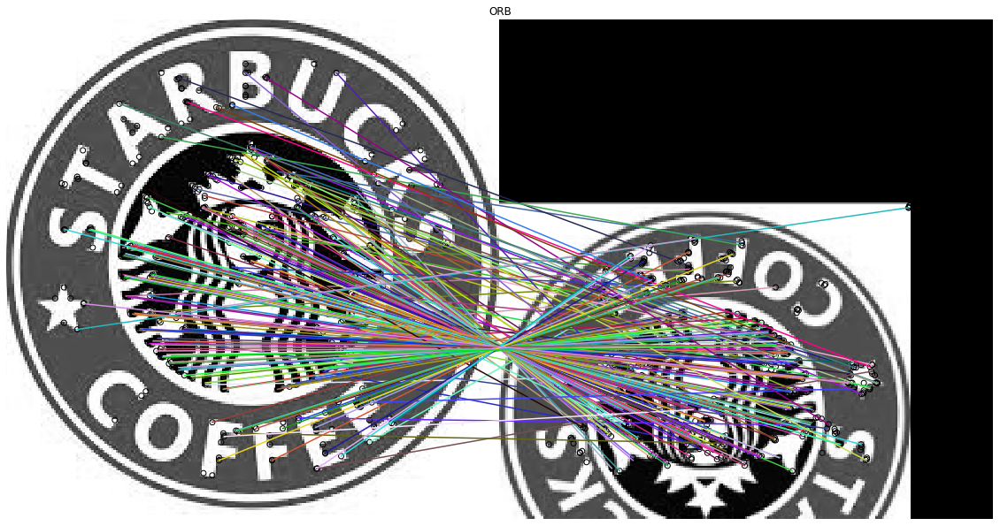

In [17]:
# Load the image and transform it
starbucks = io.imread('./images/starbucks.jpg')

rotationdegrees = 180
starbucks_rotated = transform.rotate(starbucks, rotationdegrees)

tform = transform.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
starbucks_rotate_transformed = transform.warp(starbucks_rotated, tform)

orb_images(starbucks,starbucks_rotate_transformed,(20,15))

**Optional:** Repeate the experiment with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.



Similariry:  100.0 %


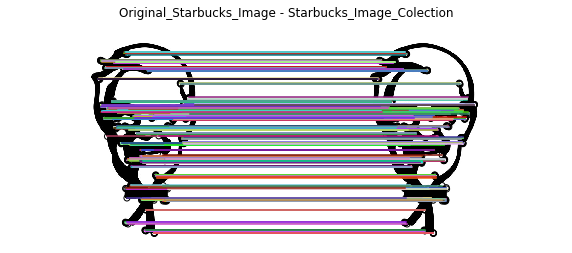

Similariry:  30.8 %


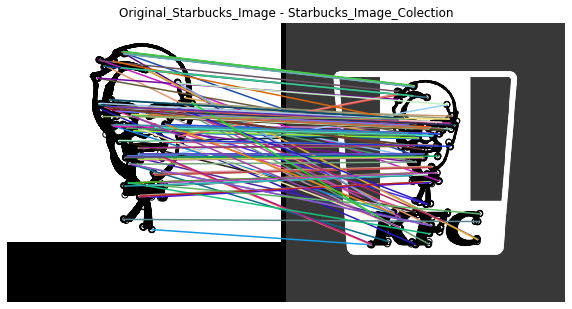

Similariry:  26.4 %


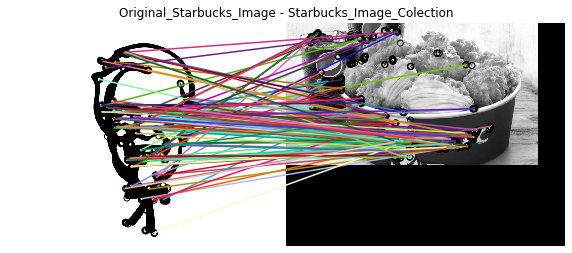

Similariry:  24.6 %


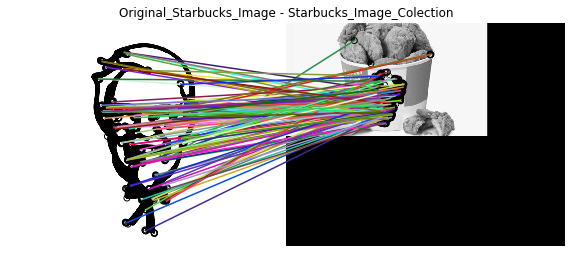

Similariry:  22.8 %


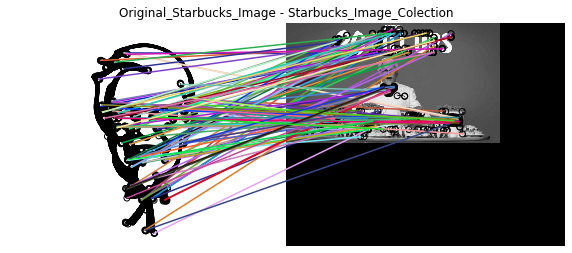

In [18]:
kfc_colec = io.ImageCollection('images/kfc/kfc*')
orig_img = io.imread('./images/kfc/kfc.jpg')
compare_orb(kfc_colec, orig_img)

### Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

1.
This means we can find also by the "context" of the image. So if we are in front of a big announce of KFC  with some logos of different forms, we can still match it.

This also means that ORB is more accurate for detecting the objects

2.
This means that if the image does not contain the logo, it will match with some points in the image that the algorithm finds that are simliar to it.

3.
Then, we have calculate the % to know which of them are the most similar to the original logo so that a 100% means that a perfect match has occured, whereas a lower % means that the image has some points in common but it is not a perfect match

## Delivery

All code sould be commented in English. Answers of the questions should be given in English too.

Compressed file **P4_Student1_Student2.zip** that includes:
- The notebook P1_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
- The images used that are not provided in P1.zip.

**Deadline (Campus Virtual): November 26th, 23:59.** 

In [19]:
#Appendix: In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)